In [3]:
import pandas as pd
import numpy as np
import os
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import OneHotEncoder
#from sklearn.model_selection import train_test_split
#import seaborn as sns
#import tensorflow as tf
from google.colab import drive
import pdb
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import json
#!pip install open3d
#!pip install --upgrade open3d
#import open3d as o3d
#from open3d.pipelines.registration import registration_icp
!pip install ipympl
import ipympl
#%matplotlib widget
from itertools import chain
from sklearn.preprocessing import MinMaxScaler
#from matplotlib.animation import FuncAnimation
from sklearn.cluster import DBSCAN
from scipy.interpolate import interp1d
import warnings
warnings.filterwarnings('ignore')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.7/515.7 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 37.4 MB/s eta 0:00:00


In [4]:
drive.mount('/content/drive')
os.chdir('/content/drive/My Drive/TCC_Telereha/')

Mounted at /content/drive


In [5]:
T = pd.read_csv('tpr_test_20240904_blazepose.csv');
mocap = pd.read_csv('test_20240904_vid0_gait1.csv');
mocapHeader = pd.read_csv('test_20240904_vid0_gait1_header_python.csv', delimiter=',', header=None);

In [6]:
# Extract all the markers
markerBool = mocapHeader.iloc[0].str.match('Marker')
markerBool = markerBool.fillna(False)
mocap_header_reduced = mocapHeader.loc[:,markerBool.values]
mocap_reduced = mocap.loc[:,markerBool.values]

#Extract only skeleton positions from all marker positions
markerBool = mocap_header_reduced.iloc[1].str.match('Skeleton')
markerBool = markerBool.fillna(False)
mocap_header_reduced = mocap_header_reduced.loc[:,markerBool.values]
mocap_reduced = mocap_reduced.loc[:,markerBool.values]

mocap_reduced_org = mocap_reduced.copy()

In [7]:
# This file assings vicon joint indicies to the (best fitting) corresponding mediapipe/blazepose joint
vicon2blazepose = pd.read_excel('vicon2blazepose.xlsx')

In [8]:
vicon_marker_list = []
blazepose_marker_list = []
for mocap_header_line in mocap_header_reduced.iloc[1]:
  for index_vicon, row_vicon in vicon2blazepose.iterrows():
    if row_vicon['Vicon Marker'] in mocap_header_line:
      vicon_marker_list.append(row_vicon['Vicon Marker'])
      blazepose_marker_list.append(row_vicon['MediaPipe Index'])
      break
print(vicon_marker_list)
print(blazepose_marker_list)
#All the joints are listed 3 times in the list (3 coordinates) -- only one entry in the list is needed
blazepose_marker_list = blazepose_marker_list[0::3]
vicon_marker_list = vicon_marker_list[0::3]
print(blazepose_marker_list)
print(vicon_marker_list)

# Contains any is used to extract the meta info from the header file
pattern = '|'.join(vicon_marker_list)
contains_any = mocap_header_reduced.iloc[1].str.contains(pattern, case=False, na=False)

['LANK', 'LANK', 'LANK', 'LASI', 'LASI', 'LASI', 'LELB', 'LELB', 'LELB', 'LFHD', 'LFHD', 'LFHD', 'LFIN', 'LFIN', 'LFIN', 'LHEE', 'LHEE', 'LHEE', 'LKNE', 'LKNE', 'LKNE', 'LPSI', 'LPSI', 'LPSI', 'LSHO', 'LSHO', 'LSHO', 'LTOE', 'LTOE', 'LTOE', 'LWRA', 'LWRA', 'LWRA', 'LWRB', 'LWRB', 'LWRB', 'RANK', 'RANK', 'RANK', 'RASI', 'RASI', 'RASI', 'RELB', 'RELB', 'RELB', 'RFHD', 'RFHD', 'RFHD', 'RFIN', 'RFIN', 'RFIN', 'RHEE', 'RHEE', 'RHEE', 'RKNE', 'RKNE', 'RKNE', 'RPSI', 'RPSI', 'RPSI', 'RSHO', 'RSHO', 'RSHO', 'RTOE', 'RTOE', 'RTOE', 'RWRA', 'RWRA', 'RWRA', 'RWRB', 'RWRB', 'RWRB']
[27, 27, 27, 23, 23, 23, 13, 13, 13, 7, 7, 7, 19, 19, 19, 29, 29, 29, 25, 25, 25, 23, 23, 23, 11, 11, 11, 31, 31, 31, 15, 15, 15, 15, 15, 15, 28, 28, 28, 24, 24, 24, 14, 14, 14, 8, 8, 8, 20, 20, 20, 30, 30, 30, 26, 26, 26, 24, 24, 24, 12, 12, 12, 32, 32, 32, 16, 16, 16, 16, 16, 16]
[27, 23, 13, 7, 19, 29, 25, 23, 11, 31, 15, 15, 28, 24, 14, 8, 20, 30, 26, 24, 12, 32, 16, 16]
['LANK', 'LASI', 'LELB', 'LFHD', 'LFIN', 'LHE

In [9]:
mocap_header_reduced.to_csv('mocap_header_reduced.csv', index=False)

In [10]:
#This code block selects the relevant joints from the mocap data and header file
print(mocap_header_reduced.shape)
print(mocap_reduced.shape)
mocap_header_reduced_org = mocap_header_reduced.copy()
mocap_reduced_org = mocap_reduced.copy()
mocap_header_reduced = mocap_header_reduced.loc[:,contains_any[contains_any==True].index]
mocap_reduced = mocap_reduced.loc[:,contains_any.values]
print(mocap_header_reduced.shape)
print(mocap_reduced.shape)

(4, 117)
(7441, 117)
(4, 72)
(7441, 72)


In [11]:
#select the first frame of both sources for comparison
blazepose_first_frame = T.iloc[range(0,33),:]
print(blazepose_first_frame.shape)
mocap_first_frame = mocap_reduced.iloc[0]
print(mocap_first_frame.shape)

(33, 8)
(72,)


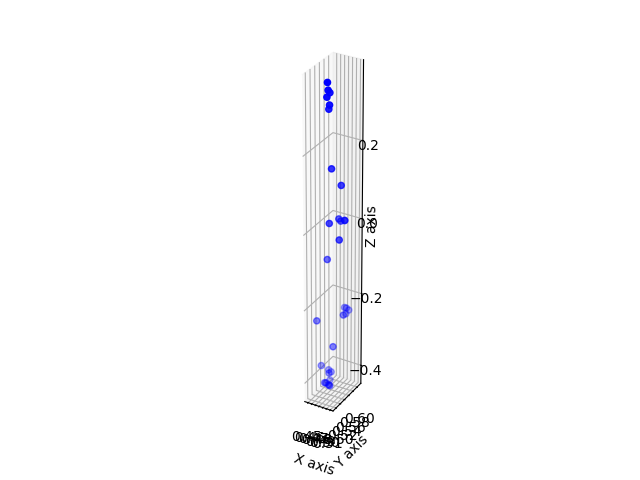

In [12]:
# plot the first frame of the ML-Model output (mediapipe)
from google.colab import output
output.enable_custom_widget_manager()
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(blazepose_first_frame[['PosX']],blazepose_first_frame[['PosY']],blazepose_first_frame[['PosZ']], c='b', marker='o')

# Add labels
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
ax.set_aspect('equal')
ax.grid(True)

In [13]:
blazepose_first_frame_org = blazepose_first_frame.copy()

In [14]:
# this removes markers from the mediapipe data which do not have corresponding vicon markers
blazepose_first_frame = blazepose_first_frame.iloc[blazepose_marker_list].reset_index(drop=True)

In [15]:
blazepose_first_frame

,vid_name,frame_num,timestamp,ind,PosX,PosY,PosZ,visibility
0,test_20240904_vid1_gait1.mp4,28,0.933333,27,0.454617,0.579598,0.289040,0.229284
1,test_20240904_vid1_gait1.mp4,28,0.933333,23,0.505419,0.534973,-0.017255,0.999776
2,test_20240904_vid1_gait1.mp4,28,0.933333,13,0.508684,0.548847,-0.223354,0.363564
3,test_20240904_vid1_gait1.mp4,28,0.933333,7,0.501783,0.494538,-0.355054,0.994670
4,test_20240904_vid1_gait1.mp4,28,0.933333,19,0.487121,0.598981,-0.254019,0.710546
5,test_20240904_vid1_gait1.mp4,28,0.933333,29,0.449612,0.576737,0.308295,0.352385
6,test_20240904_vid1_gait1.mp4,28,0.933333,25,0.486873,0.575871,0.098177,0.091042
7,test_20240904_vid1_gait1.mp4,28,0.933333,23,0.505419,0.534973,-0.017255,0.999776
8,test_20240904_vid1_gait1.mp4,28,0.933333,11,0.512545,0.494563,-0.278607,0.999577
9,test_20240904_vid1_gait1.mp4,28,0.933333,31,0.445494,0.592150,0.271245,0.252310


In [16]:
def calculate_angle(a, b, c):
    """
    calculate a joint angle based on the 3 input joints
    :param a: first joint
    :param b: second joint
    :param c: third joint
    :return: angle in degrees
    """
    # Define the 3D coordinates of the points
    if len(a.shape)==2:
      A = np.array([a['PosX'], a['PosY'], a['PosZ']])
      B = np.array([b['PosX'], b['PosY'], b['PosZ']])
      C = np.array([c['PosX'], c['PosY'], c['PosZ']])
      A = A.transpose()[0]
      B = B.transpose()[0]
      C = C.transpose()[0]
    else:
      A = np.array(a)
      B = np.array(b)
      C = np.array(c)
    try:
      AB = B - A
      BC = C - B
    except:
      print(A)
      print(B)
      print(C)
      pdb.set_trace()
    # Calculate the dot product of AB and BC
    dot_product = np.dot(AB, BC)

    # Calculate the magnitudes of AB and BC
    magnitude_AB = np.linalg.norm(AB)
    magnitude_BC = np.linalg.norm(BC)

    # Calculate the angle in radians and then convert to degrees
    angle_rad = np.arccos(dot_product / (magnitude_AB * magnitude_BC))
    angle_deg = np.degrees(angle_rad)
    return angle_deg

In [17]:
def calculate_angle_2d(v1, v2):
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    # Calculate the angle in radians and then convert to degrees
    angle_radians = np.arccos(dot_product / (norm_v1 * norm_v2))
    angle_degrees = np.degrees(angle_radians)
    return angle_degrees

def angles_in_plane(A, B, C, plane):
    """
    Calculate the angle between two vectors in a plane.
    :param a: first joint
    :param b: second joint
    :param c: third joint
    :param plane: the plane in which to calculate
    :return: angle in degrees
    """
    if len(A.shape)==2:
      A = np.array([A['PosX'], A['PosY'], A['PosZ']])
      B = np.array([B['PosX'], B['PosY'], B['PosZ']])
      C = np.array([C['PosX'], C['PosY'], C['PosZ']])
      A = A.transpose()[0]
      B = B.transpose()[0]
      C = C.transpose()[0]
    else:
      A = np.array(A)
      B = np.array(B)
      C = np.array(C)
    if plane == 'xy':
        A_proj = A[:2]  # Discard z-coordinate
        B_proj = B[:2]
        C_proj = C[:2]
    elif plane == 'xz':
        A_proj = A[[0, 2]]  # Discard y-coordinate
        B_proj = B[[0, 2]]
        C_proj = C[[0, 2]]
    elif plane == 'yz':
        A_proj = A[1:]  # Discard x-coordinate
        B_proj = B[1:]
        C_proj = C[1:]

    # Create vectors AB and BC in the plane
    AB = B_proj - A_proj
    BC = C_proj - B_proj

    # Calculate the angle between vectors AB and BC
    angle = calculate_angle_2d(AB, BC)
    return angle

In [18]:
def get_mediapipe_marker_positions(data_in,def_in,this_joint):
  """
  get the coordinates of the mediapipe markers for a given joint
  """
  anker1 = def_in[this_joint]['Anker1']
  joint = def_in[this_joint]['ActualJoint']
  anker2 = def_in[this_joint]['Anker2']
  anker1_coordinates = data_in.loc[data_in.ind == anker1]
  joint_coordinates = data_in.loc[data_in.ind == joint]
  anker2_coordinates = data_in.loc[data_in.ind == anker2]
  return anker1_coordinates, joint_coordinates, anker2_coordinates
def get_vicon_marker_positions(data_in,header,def_in,this_joint):
  """
  get the coordinates of the vicon markers for a given joint
  """
  anker1 = def_in[this_joint]['Anker1']
  joint = def_in[this_joint]['ActualJoint']
  anker2 = def_in[this_joint]['Anker2']
  matching_columns_anker1 = [header.columns.get_loc(col) for col in header.columns if anker1 in str(header.loc[1, col])]
  matching_columns_joint = [header.columns.get_loc(col) for col in header.columns if joint in str(header.loc[1, col])]
  matching_columns_anker2 = [header.columns.get_loc(col) for col in header.columns if anker2 in str(header.loc[1, col])]
  anker1_coordinates = data_in.iloc[matching_columns_anker1]
  joint_coordinates = data_in.iloc[matching_columns_joint]
  anker2_coordinates = data_in.iloc[matching_columns_anker2]
  # If there is a missing marker, try to use an alternative marker
  # This alternative is specified in the JSON file
  if (len(anker1_coordinates) == 0 or np.isnan(anker1_coordinates).any()) and def_in[this_joint]['AltAnker1'] != "":
    anker1 = def_in[this_joint]['AltAnker1']
    matching_columns_anker1 = [header.columns.get_loc(col) for col in header.columns if anker1 in str(header.loc[1, col])]
    anker1_coordinates = data_in.iloc[matching_columns_anker1]
  if (len(anker2_coordinates) == 0 or np.isnan(anker2_coordinates).any()) and def_in[this_joint]['AltAnker2'] != "":
    anker2 = def_in[this_joint]['AltAnker2']
    matching_columns_anker2 = [header.columns.get_loc(col) for col in header.columns if anker2 in str(header.loc[1, col])]
    anker2_coordinates = data_in.iloc[matching_columns_anker2]
  return anker1_coordinates, joint_coordinates, anker2_coordinates


In [19]:
def get_vicon_marker_positions1(data_in,header,def_in,this_joint):
  pdb.set_trace()
  anker1 = def_in[this_joint]['Anker1']
  joint = def_in[this_joint]['ActualJoint']
  anker2 = def_in[this_joint]['Anker2']
  matching_columns_anker1 = [header.columns.get_loc(col) for col in header.columns if anker1 in str(header.loc[1, col])]
  matching_columns_joint = [header.columns.get_loc(col) for col in header.columns if joint in str(header.loc[1, col])]
  matching_columns_anker2 = [header.columns.get_loc(col) for col in header.columns if anker2 in str(header.loc[1, col])]
  anker1_coordinates = data_in.iloc[matching_columns_anker1]
  joint_coordinates = data_in.iloc[matching_columns_joint]
  anker2_coordinates = data_in.iloc[matching_columns_anker2]
  if (len(anker1_coordinates) == 0 or np.isnan(anker1_coordinates).any()) and def_in[this_joint]['AltAnker1'] != "":
    anker1 = def_in[this_joint]['AltAnker1']
    matching_columns_anker1 = [header.columns.get_loc(col) for col in header.columns if anker1 in str(header.loc[1, col])]
    anker1_coordinates = data_in.iloc[matching_columns_anker1]
  if len(anker2_coordinates) == 0 or np.isnan(anker2_coordinates).any():
    anker2 = def_in[this_joint]['AltAnker2']
    matching_columns_anker2 = [header.columns.get_loc(col) for col in header.columns if anker2 in str(header.loc[1, col])]
    anker2_coordinates = data_in.iloc[matching_columns_anker2]
  return anker1_coordinates, joint_coordinates, anker2_coordinates

In [20]:
# Open and read the JSON file
with open('mediapipeAngleDefinition.json', 'r') as file:
    mediapipe_angle_definition = json.load(file)
with open('viconAngleDefinition.json', 'r') as file:
    vicon_angle_definition = json.load(file)
joints = ['RightKneeAngle','LeftKneeAngle','LeftShoulderAngle','RightShoulderAngle','LeftElbowAngle','RightElbowAngle','LeftHipAngle','RightHipAngle','LeftAnkleAngle','RightAnkleAngle']


Resample vicon data

In [21]:
#This shows the length of the two data series
print(T.shape[0]/33)
print(mocap_reduced_org.shape[0])
mocap_new = mocap_reduced_org[0:2000]
T_new = T[0:19800]
print(mocap_new.shape[0]/100)
print(T_new.shape[0]/33)

5258.818181818182
7441
20.0
600.0


In [22]:
# very rudementary approach of resampling the data to the same sampling rate
time_100hz = np.linspace(0, 20, 2000)  # time for 100 Hz array
time_30hz = np.linspace(0, 20, 600)   # time for 30 Hz array
df_30hz = pd.DataFrame(index=time_30hz, columns=mocap_new.columns)
for column in mocap_new.columns:
    interpolator = interp1d(mocap_new.index, mocap_new[column], kind='linear')  # Interpolator for each column
    df_30hz[column] = interpolator(time_30hz)
mocap_30hz = df_30hz

In [24]:
# This code block creates a dataframe which has the following parameters for a given
# joint (in the joints list):
# Mediapipe Frame: the number of the frame of the mediapipe result
# Vicon Frame: the number of the frame of the vicon data
# for every Mediapipe frame i assumed 3 vicon frames due to the difference in the sampling rate
# mediapipe angle: angle of the joint based on mediapipe result
# vicon angle: angle of the joint based on vicon data
# AngleDifference: difference between mediapipe and vicon angle
# Joint: name of the current joint
# AngleDifferenceMeanOverSameFrame: mean difference between the angles over all 3 vicon frames per mediapipe frame

blazepose_first_frame = T.iloc[range(0,33),:]
mediapipe_angle_list = []
vicon_angle_list = []
rows = []
df = pd.DataFrame(columns=['MediapipeFrame', 'ViconFrame', 'MediapipeAngle','ViconAngle','AngleDifference','Joint'])
for this_joint in joints: # iterate over the joints list
  for i in range(0,10): # only look at the first 10 mediapipe frames (just for testing)
    this_blazepose_frame = T.iloc[range(0+i*33,33+i*33+i),:] # select all the joints for the current mediapipe frame

    # get the coordinates of that joint for that frame
    mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates = get_mediapipe_marker_positions(this_blazepose_frame,mediapipe_angle_definition,this_joint)
    mediapipe_angle = calculate_angle(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates)
    mediapipe_angle_list.append(mediapipe_angle)

    for j in range(i*3,i*3+3): # iterate over the corresponding vicon frames
      this_mocap_frame = mocap_reduced_org.iloc[j]
      #get the vicon joint positions
      vicon_anker1_coordinates, vicon_joint_coordinates, vicon_anker2_coordinates = get_vicon_marker_positions(this_mocap_frame,mocap_header_reduced_org,vicon_angle_definition,this_joint)
      if len(vicon_anker1_coordinates)==117: # apperently something should not be 117
        vicon_angle_list.append(np.nan)
      else:
        # calculate the angle
        vicon_angle = calculate_angle(vicon_anker1_coordinates, vicon_joint_coordinates, vicon_anker2_coordinates)
        vicon_angle_list.append(vicon_angle)

      #create a row with the previously described parameters and append it to a list
      row = {'MediapipeFrame':i,'ViconFrame':j,'MediapipeAngle':mediapipe_angle,'ViconAngle':vicon_angle,'AngleDifference':abs(mediapipe_angle-vicon_angle),'Joint':this_joint}
      rows.append(row)

# create a dataframe out of this list
df = pd.DataFrame(rows)
expanded_means = []

# calculate the mean of the difference over the 3 vicon frames per mediapipe frame
for this_joint in joints:
  this_df = df.loc[df['Joint'] == this_joint]
  block_size = 3
  arr = this_df['AngleDifference'].to_numpy()
  means= arr.reshape(-1, 3).mean(axis=1)
  expanded_means.append(np.repeat(means, block_size))

df['AngleDifferenceMeanOverSameFrame'] = list(chain.from_iterable(expanded_means))
df.to_excel('angle_difference.xlsx', index=False)

In [25]:
df

,MediapipeFrame,ViconFrame,MediapipeAngle,ViconAngle,AngleDifference,Joint,AngleDifferenceMeanOverSameFrame
0,0,0,11.653219,9.332300,2.320920,RightKneeAngle,2.316452
1,0,1,11.653219,9.338315,2.314904,RightKneeAngle,2.316452
2,0,2,11.653219,9.339688,2.313531,RightKneeAngle,2.316452
3,1,3,17.313841,9.358234,7.955607,RightKneeAngle,7.968002
4,1,4,17.313841,9.343168,7.970673,RightKneeAngle,7.968002
...,...,...,...,...,...,...,...
295,8,25,85.204348,87.144021,1.939673,RightAnkleAngle,1.956301
296,8,26,85.204348,87.253078,2.048730,RightAnkleAngle,1.956301
297,9,27,82.961417,87.079242,4.117825,RightAnkleAngle,4.078120
298,9,28,82.961417,86.936613,3.975195,RightAnkleAngle,4.078120


In [ ]:
def plot_angle_difference_2d_projection(blazepose_df,frame_num_blazepose,mediapipe_angle_definition, joints):
  """
  plot function for the angles in a 2d projection
  """
  fig, ax = plt.subplots(1, 3, figsize=(15, 5),subplot_kw={'projection': '3d'})
  for this_joint in joints:
    this_blazepose_frame = blazepose_df.iloc[range(0+frame_num_blazepose*33,33+frame_num_blazepose*33+frame_num_blazepose),:]
    mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates = get_mediapipe_marker_positions(this_blazepose_frame,mediapipe_angle_definition,this_joint)
    vector1 = mediapipe_anker1_coordinates[['PosX','PosY','PosZ']].values - mediapipe_joint_coordinates[['PosX','PosY','PosZ']].values
    vector2 = mediapipe_anker2_coordinates[['PosX','PosY','PosZ']].values - mediapipe_joint_coordinates[['PosX','PosY','PosZ']].values
    vector1 = vector1[0]
    vector2 = vector2[0]
    cos_theta = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))
    angle_degrees = np.degrees(np.arccos(cos_theta))
    angle_2d_xy = angles_in_plane(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates,'xy')
    angle_2d_xz = angles_in_plane(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates,'xz')
    angle_2d_yz = angles_in_plane(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates,'yz')

    angle_text_x = mediapipe_joint_coordinates['PosX'].values[0] + 0.5 * (mediapipe_anker1_coordinates['PosX'].values[0] + mediapipe_anker2_coordinates['PosX'].values[0] - 2 * mediapipe_joint_coordinates['PosX'].values[0])
    angle_text_y = mediapipe_joint_coordinates['PosY'].values[0] + 0.5 * (mediapipe_anker1_coordinates['PosY'].values[0] + mediapipe_anker2_coordinates['PosY'].values[0] - 2 * mediapipe_joint_coordinates['PosY'].values[0])
    angle_text_z = mediapipe_joint_coordinates['PosZ'].values[0] + 0.5 * (mediapipe_anker1_coordinates['PosZ'].values[0] + mediapipe_anker2_coordinates['PosZ'].values[0] - 2 * mediapipe_joint_coordinates['PosZ'].values[0])

    ax[0].text(angle_text_x, angle_text_y, angle_text_z, f'{angle_2d_xy:.2f}°', color='red', fontsize=12)
    ax[0].plot([mediapipe_anker1_coordinates['PosX'].values[0], mediapipe_joint_coordinates['PosX'].values[0], mediapipe_anker2_coordinates['PosX'].values[0]],
            [mediapipe_anker1_coordinates['PosY'].values[0], mediapipe_joint_coordinates['PosY'].values[0], mediapipe_anker2_coordinates['PosY'].values[0]],
            [mediapipe_anker1_coordinates['PosZ'].values[0], mediapipe_joint_coordinates['PosZ'].values[0], mediapipe_anker2_coordinates['PosZ'].values[0]],
            marker='o', color='b', label='Line between points')

    mediapipe_angle = calculate_angle(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates)


    ax[0].scatter(this_blazepose_frame[['PosX']],this_blazepose_frame[['PosY']],this_blazepose_frame[['PosZ']], c='b', marker='o')

    ax[1].text(angle_text_x, angle_text_y, angle_text_z, f'{angle_2d_yz:.2f}°', color='red', fontsize=12)
    ax[1].plot([mediapipe_anker1_coordinates['PosX'].values[0], mediapipe_joint_coordinates['PosX'].values[0], mediapipe_anker2_coordinates['PosX'].values[0]],
            [mediapipe_anker1_coordinates['PosY'].values[0], mediapipe_joint_coordinates['PosY'].values[0], mediapipe_anker2_coordinates['PosY'].values[0]],
            [mediapipe_anker1_coordinates['PosZ'].values[0], mediapipe_joint_coordinates['PosZ'].values[0], mediapipe_anker2_coordinates['PosZ'].values[0]],
            marker='o', color='b', label='Line between points')

    mediapipe_angle = calculate_angle(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates)


    ax[1].scatter(this_blazepose_frame[['PosX']],this_blazepose_frame[['PosY']],this_blazepose_frame[['PosZ']], c='b', marker='o')

    ax[2].text(angle_text_x, angle_text_y, angle_text_z, f'{angle_2d_xz:.2f}°', color='red', fontsize=12)
    ax[2].plot([mediapipe_anker1_coordinates['PosX'].values[0], mediapipe_joint_coordinates['PosX'].values[0], mediapipe_anker2_coordinates['PosX'].values[0]],
            [mediapipe_anker1_coordinates['PosY'].values[0], mediapipe_joint_coordinates['PosY'].values[0], mediapipe_anker2_coordinates['PosY'].values[0]],
            [mediapipe_anker1_coordinates['PosZ'].values[0], mediapipe_joint_coordinates['PosZ'].values[0], mediapipe_anker2_coordinates['PosZ'].values[0]],
            marker='o', color='b', label='Line between points')

    mediapipe_angle = calculate_angle(mediapipe_anker1_coordinates, mediapipe_joint_coordinates, mediapipe_anker2_coordinates)


    ax[2].scatter(this_blazepose_frame[['PosX']],this_blazepose_frame[['PosY']],this_blazepose_frame[['PosZ']], c='b', marker='o')


  # Add labels
  ax[0].set_xlabel('X axis')
  ax[0].set_ylabel('Y axis')
  ax[0].set_zlabel('Z axis')
  ax[0].set_aspect('equal')
  ax[0].view_init(elev=90, azim=-90) # XY Plane

  ax[1].set_xlabel('X axis')
  ax[1].set_ylabel('Y axis')
  ax[1].set_zlabel('Z axis')
  ax[1].set_aspect('equal')
  ax[1].view_init(elev=0, azim=0) #YZ Plane

  ax[2].set_xlabel('X axis')
  ax[2].set_ylabel('Y axis')
  ax[2].set_zlabel('Z axis')
  ax[2].set_aspect('equal')
  ax[2].view_init(elev=0, azim=90) #XZ Plane
  plt.tight_layout()
  plt.show()

In [ ]:
def plot_angle_difference_3d_mediapipe(df,frame_num_in,angle_definition, joints):
  """
  plot the mediapipe angles in a 3d plot
  """
  num_plots = frame_num_in
  fig = plt.figure(figsize=(num_plots * 3, 4))
  colors = ["red", "green", "blue", "yellow", "orange", "purple", "pink", "brown", "black", "white", "gray"]
  j = 0
  for frame_num in range(0,frame_num_in):
    i = 0
    ax = fig.add_subplot(1, num_plots, j + 1, projection='3d')  # Create a 3D subplot

    for this_joint in joints:
      this_frame = df.iloc[range(0+frame_num*33,33+frame_num*33+frame_num),:]
      anker1_coordinates, joint_coordinates, anker2_coordinates = get_mediapipe_marker_positions(this_frame,angle_definition,this_joint)
      vector1 = anker1_coordinates[['PosX','PosY','PosZ']].values - joint_coordinates[['PosX','PosY','PosZ']].values
      vector2 = anker2_coordinates[['PosX','PosY','PosZ']].values - joint_coordinates[['PosX','PosY','PosZ']].values
      vector1 = vector1[0]
      vector2 = vector2[0]
      cos_theta = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))
      angle_degrees = np.degrees(np.arccos(cos_theta))
      angle_text_x = joint_coordinates['PosX'].values[0] + 0.5 * (anker1_coordinates['PosX'].values[0] + anker2_coordinates['PosX'].values[0] - 2 * joint_coordinates['PosX'].values[0])
      angle_text_y = joint_coordinates['PosY'].values[0] + 0.5 * (anker1_coordinates['PosY'].values[0] + anker2_coordinates['PosY'].values[0] - 2 * joint_coordinates['PosY'].values[0])
      angle_text_z = joint_coordinates['PosZ'].values[0] + 0.5 * (anker1_coordinates['PosZ'].values[0] + anker2_coordinates['PosZ'].values[0] - 2 * joint_coordinates['PosZ'].values[0])
      try:
        ax.text(angle_text_x, angle_text_y, angle_text_z, f'{angle_degrees:.2f}°', color='red', fontsize=12)
        ax.plot([anker1_coordinates['PosX'].values[0], joint_coordinates['PosX'].values[0], anker2_coordinates['PosX'].values[0]],
                [anker1_coordinates['PosY'].values[0], joint_coordinates['PosY'].values[0], anker2_coordinates['PosY'].values[0]],
                [anker1_coordinates['PosZ'].values[0], joint_coordinates['PosZ'].values[0], anker2_coordinates['PosZ'].values[0]],
                marker='o', color='b', label='Line between points')

        #pdb.set_trace()
        mediapipe_angle = calculate_angle(anker1_coordinates, joint_coordinates, anker2_coordinates)


        ax.scatter(this_frame[['PosX']],this_frame[['PosY']],this_frame[['PosZ']], c='b', marker='o')
      except:
        pdb.set_trace()
      i += 1
    j += 1
    # Add labels
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.grid(True)
  #plt.gca().invert_yaxis()
  plt.tight_layout()
  plt.show()

In [ ]:
def plot_angle_difference_3d_vicon(df,frame_num_in,angle_definition, joints,mocap_header_reduced_org):
  """
  plot the vicon angles in a 3d plot
  """
  num_plots = frame_num_in
  fig = plt.figure(figsize=(num_plots * 3, 4))
  colors = ["red", "green", "blue", "yellow", "orange", "purple", "pink", "brown", "black", "white", "gray"]
  with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=warnings.WarningMessage)
    j = 0
    for frame_num in range(0,frame_num_in):
      i = 0
      ax = fig.add_subplot(1, num_plots, j + 1, projection='3d')  # Create a 3D subplot

      for this_joint in joints:
        this_frame = df.iloc[frame_num]
        #this_frame = this_frame.replace([np.inf, -np.inf], np.nan).fillna(0)
        anker1_coordinates, joint_coordinates, anker2_coordinates = get_vicon_marker_positions(this_frame,mocap_header_reduced_org,angle_definition,this_joint)
        try:
          vector1 = anker1_coordinates.values - joint_coordinates.values
          vector2 = anker2_coordinates.values - joint_coordinates.values
        except:
          get_vicon_marker_positions1(this_frame,mocap_header_reduced_org,angle_definition,this_joint)
          pdb.set_trace()
          continue
        cos_theta = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))
        angle_degrees = np.degrees(np.arccos(cos_theta))
        angle_text_x = joint_coordinates[0] + 0.5 * (anker1_coordinates[0] + anker2_coordinates[0] - 2 * joint_coordinates[0])
        angle_text_y = joint_coordinates[1] + 0.5 * (anker1_coordinates[1] + anker2_coordinates[1] - 2 * joint_coordinates[1])
        angle_text_z = joint_coordinates[2] + 0.5 * (anker1_coordinates[2] + anker2_coordinates[2] - 2 * joint_coordinates[2])
        try:
          ax.text(angle_text_x, angle_text_y, angle_text_z, f'{angle_degrees:.2f}°', color=colors[i], fontsize=12)
          ax.plot([anker1_coordinates[0], joint_coordinates[0], anker2_coordinates[0]],
                  [anker1_coordinates[1], joint_coordinates[1], anker2_coordinates[1]],
                  [anker1_coordinates[2], joint_coordinates[2], anker2_coordinates[2]],
                  marker='o', color=colors[i], label='Line between points')

          #pdb.set_trace()
          angle_3d = calculate_angle(anker1_coordinates, joint_coordinates, anker2_coordinates)
          angle_2d_xy = angles_in_plane(anker1_coordinates, joint_coordinates, anker2_coordinates,'xy')
          angle_2d_xz = angles_in_plane(anker1_coordinates, joint_coordinates, anker2_coordinates,'xz')
          angle_2d_yz = angles_in_plane(anker1_coordinates, joint_coordinates, anker2_coordinates,'yz')
          ax.scatter(this_frame[::3],this_frame[1::3],this_frame[2::3], c='b', marker='o')
        except:
          pass
          pdb.set_trace()
        i += 1
      j += 1

      # Add labels
      ax.set_xlabel('X axis')
      ax.set_ylabel('Y axis')
      ax.set_zlabel('Z axis')
      ax.set_aspect('equal')

      ax.grid(True)
    plt.tight_layout()
    plt.show()

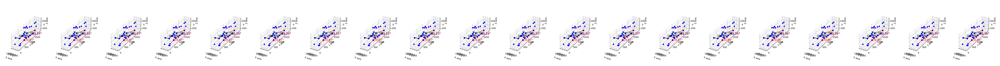

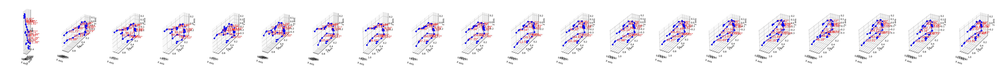

In [ ]:
# call the plot functions and supress some plot related warnings
import warnings
import logging
logging.getLogger('matplotlib.text').setLevel(logging.ERROR)
plot_angle_difference_3d_vicon(df=mocap_30hz,frame_num_in=20,angle_definition=vicon_angle_definition,joints=joints,mocap_header_reduced_org=mocap_header_reduced_org)
plot_angle_difference_3d_mediapipe(df=T_new,frame_num_in=20,angle_definition=mediapipe_angle_definition,joints=joints)

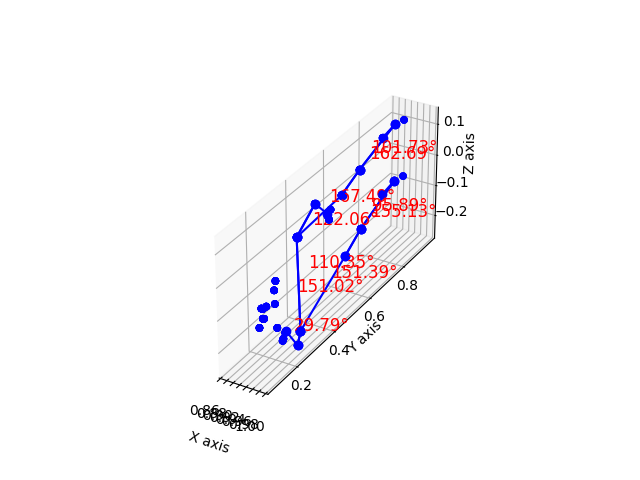

In [ ]:
# plot the mediapipe angles in 3d
plot_angle_difference_3d_mediapipe(df=T,frame_num=1,angle_definition=mediapipe_angle_definition,joints=joints)

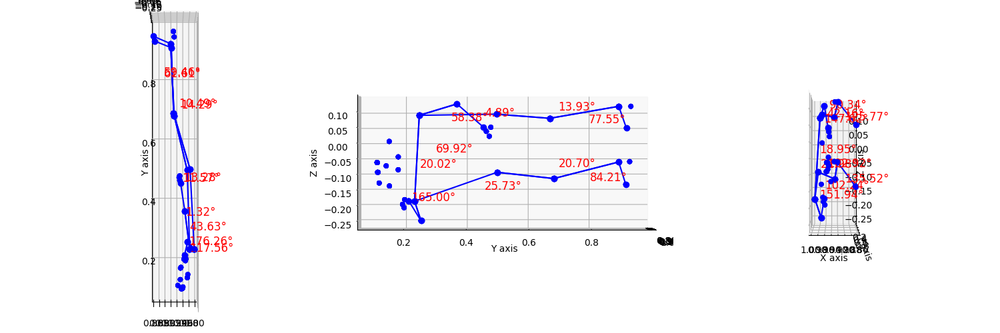

In [ ]:
# plot the mediapipe angles in a 2d projection
plot_angle_difference_2d_projection(T,1,mediapipe_angle_definition,joints)

In [27]:
# initializing a scaler
scaler = MinMaxScaler()
T.vid_name.unique()

array(['test_20240904_vid1_gait1.mp4', 'test_20240904_vid0_gait1.mp4',
       'test_20240904_vid0_pgait.mp4', 'test_20240904_vid1_pgait.mp4'],
      dtype=object)

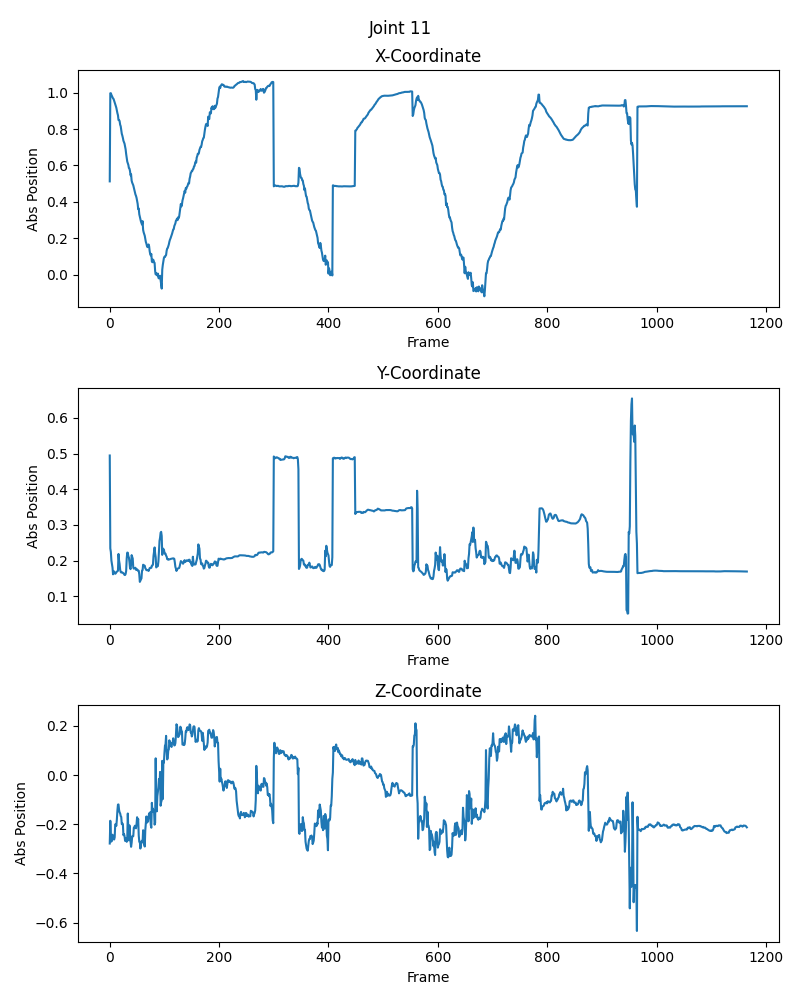

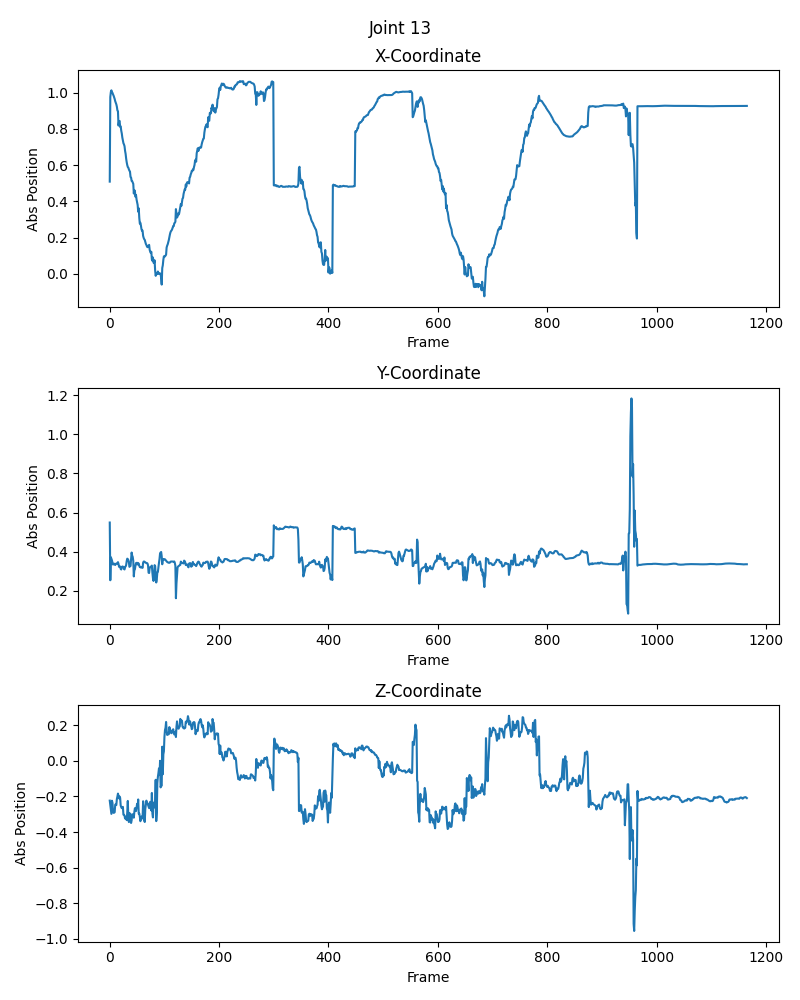

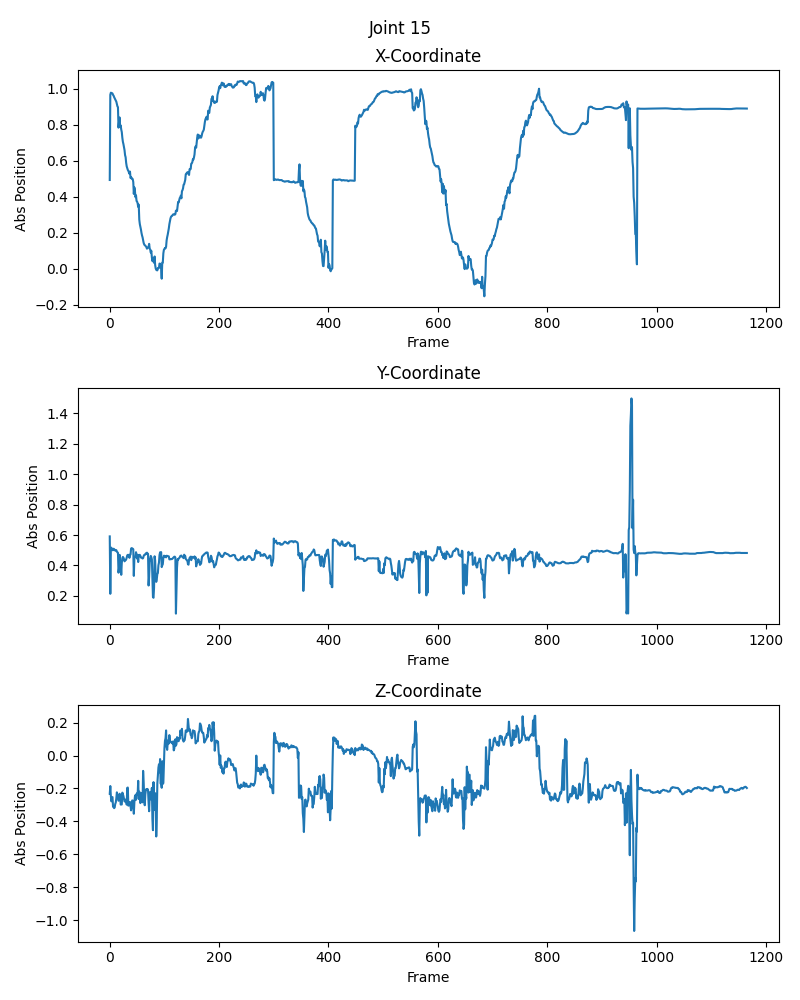

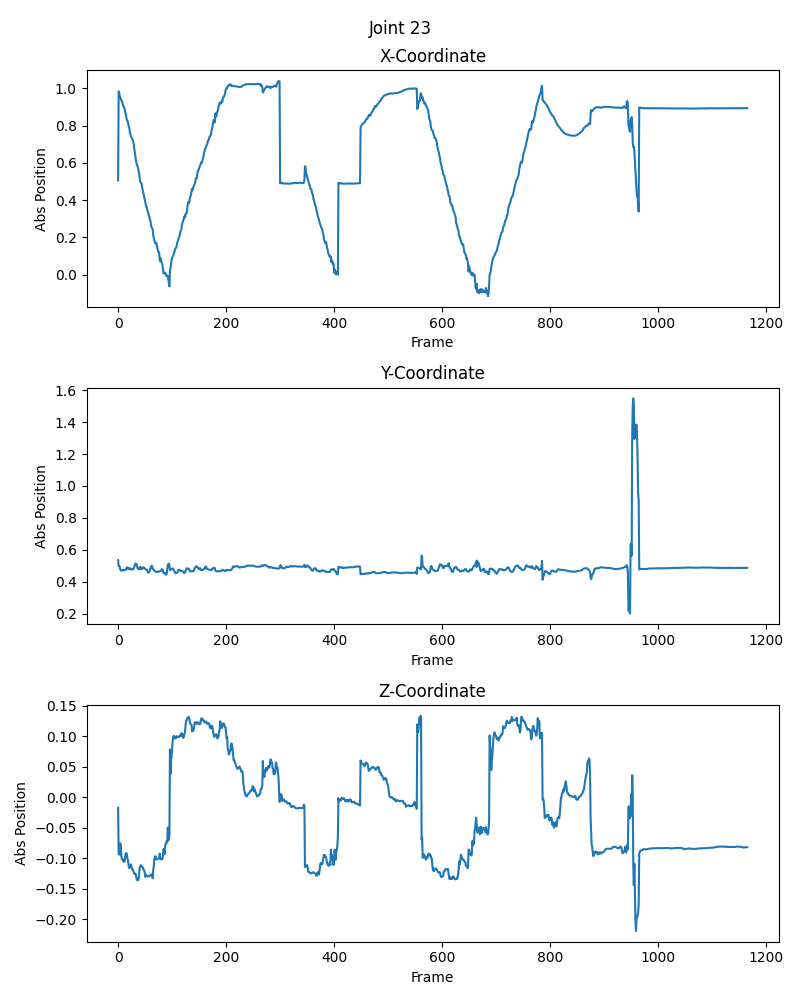

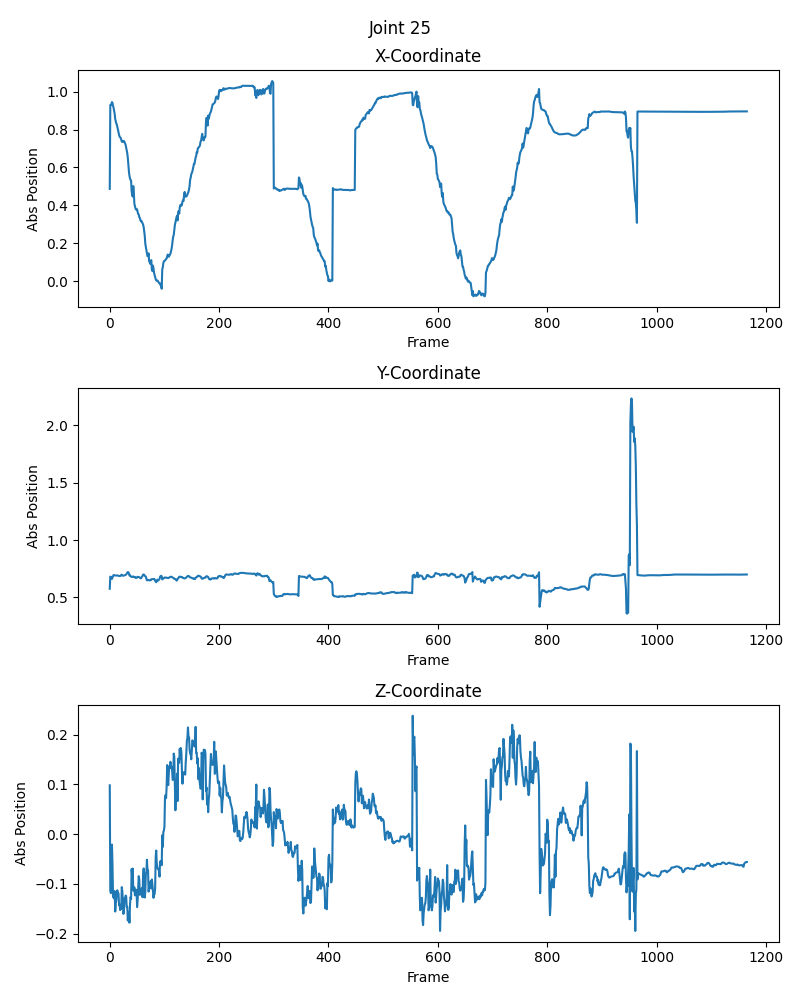

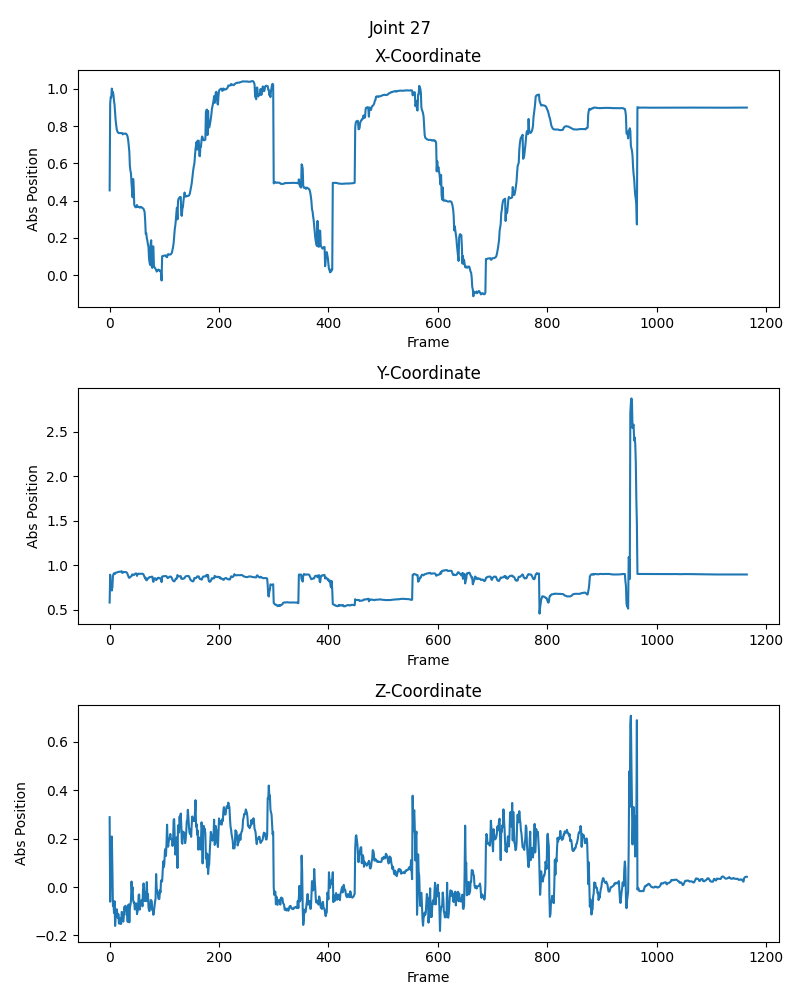

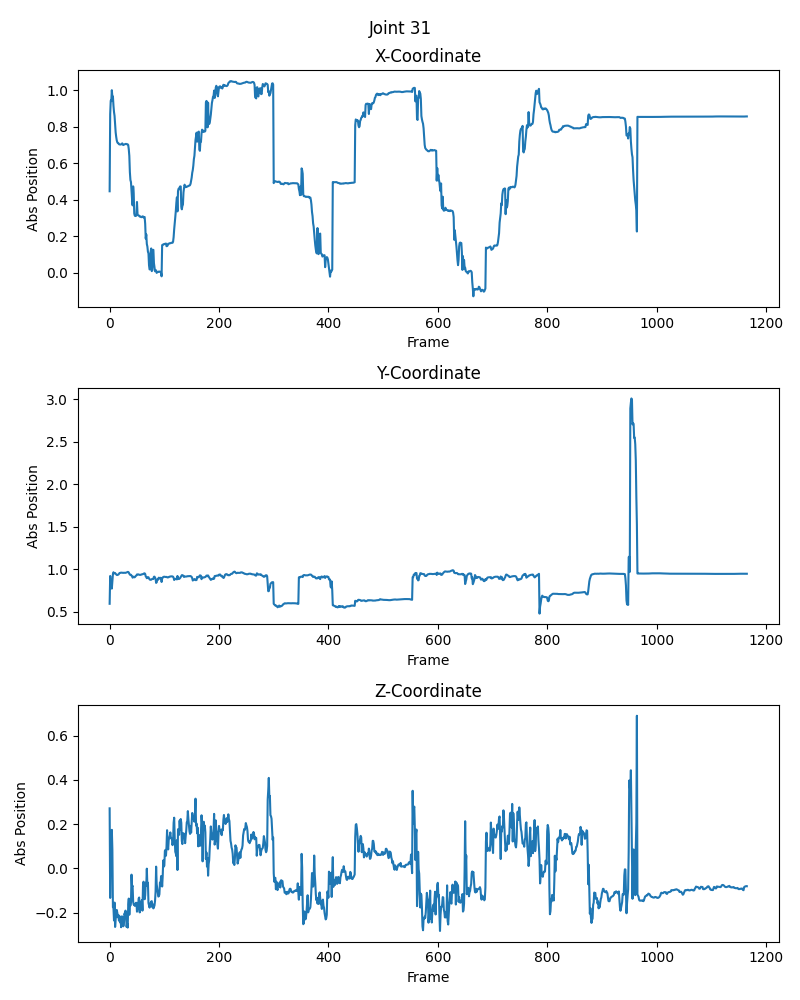

In [28]:
# plotting the coordinates of specific joints over time
joints_of_interest = [11,13,15,23,25,27,31]
for i in joints_of_interest:
  this_T = T[T['ind']==i]
  this_T = this_T[this_T['vid_name']=='test_20240904_vid1_gait1.mp4']
  this_T.reset_index(drop=True, inplace=True)
  x_pos = this_T[['PosX']]
  y_pos = this_T[['PosY']]
  z_pos = this_T[['PosZ']]
  #x_pos = scaler.fit_transform(x_pos)
  #y_pos = scaler.fit_transform(y_pos)
  #z_pos = scaler.fit_transform(z_pos)
  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 10))
  fig.suptitle(f'Joint {i}')
  ax1.plot(x_pos)
  ax1.set_title('X-Coordinate')
  ax1.set_ylabel('Abs Position')
  ax1.set_xlabel('Frame')
  ax2.plot(y_pos)
  ax2.set_title('Y-Coordinate')
  ax2.set_ylabel('Abs Position')
  ax2.set_xlabel('Frame')
  ax3.plot(z_pos)
  ax3.set_title('Z-Coordinate')
  ax3.set_ylabel('Abs Position')
  ax3.set_xlabel('Frame')
  #fig.add_subplot(111, projection='3d' ,frame_on=False)
  #plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
  plt.tight_layout()
  plt.show()


In [29]:
def remove_outliers_iqr(data):
    """Removes outliers from a NumPy array using the IQR method.

    Args:
        data: NumPy array containing the data.

    Returns:
        NumPy array with outliers removed.
    """
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_mask = (data < lower_bound) | (data > upper_bound)  # Boolean mask for outliers
    return outlier_mask

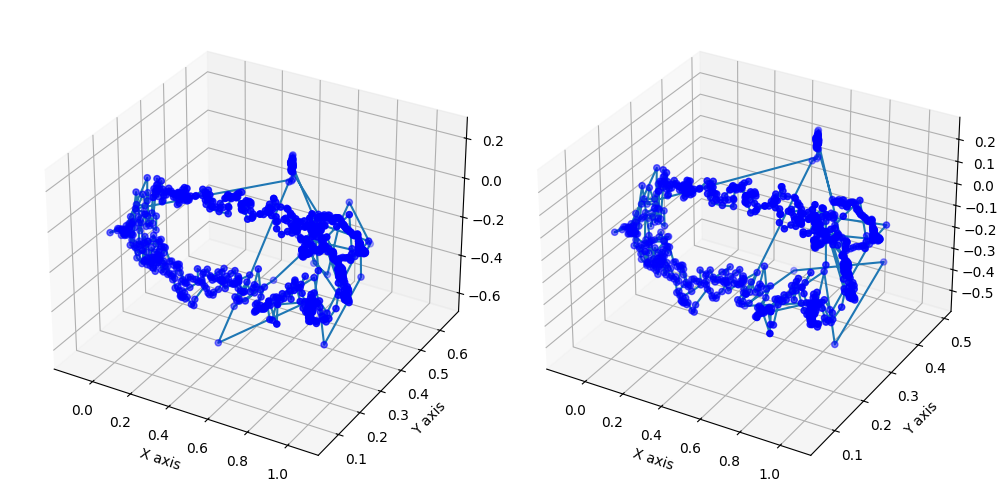

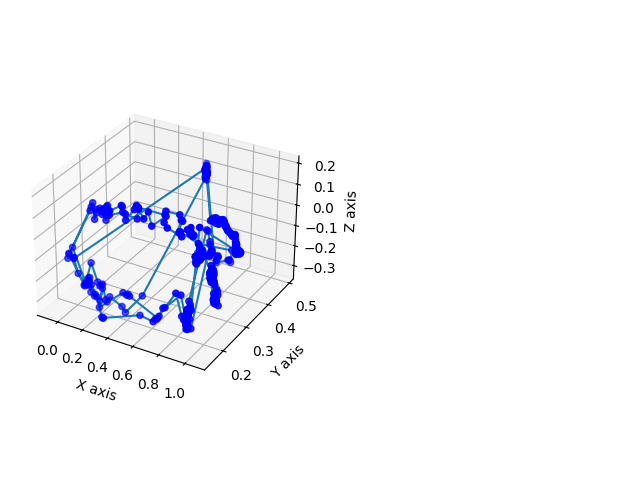

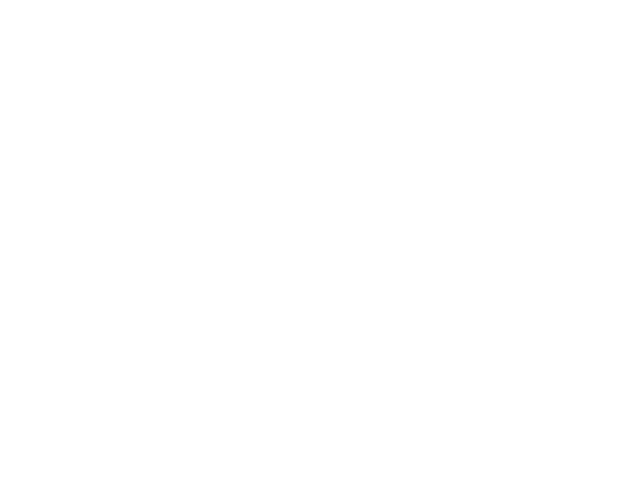

In [30]:
# Plotting a single joint over time unfiltered (left plot) vs filtered (right plot)

this_T = T[T['ind']==11]
this_T = this_T[this_T['vid_name']=='test_20240904_vid1_gait1.mp4']
this_T.reset_index(drop=True, inplace=True)
x_pos = this_T[['PosX']].values
y_pos = this_T[['PosY']].values
z_pos = this_T[['PosZ']].values
# Create a figure and 3D axis
fig = plt.figure()
fig = plt.figure(figsize=(10, 5))  # Adjust figure size as needed
ax1 = fig.add_subplot(121, projection='3d')  # 1x2 grid, first subplot
ax2 = fig.add_subplot(122, projection='3d')  # 1x2 grid, second subplot

# Update function for the animation
def update1(frame):
    # Update the point's data for the new frame
    point.set_data(x_pos[frame], y_pos[frame])
    point.set_3d_properties(z_pos[frame])
    pdb.set_trace()
    return point,
x_pos = x_pos.flatten()
y_pos = y_pos.flatten()
z_pos = z_pos.flatten()

ax1.plot(x_pos, y_pos, z_pos, label='3D Trajectory')
ax1.scatter(x_pos, y_pos, z_pos, c='b', marker='o')

ax1.set_xlabel('X axis')
ax1.set_ylabel('Y axis')
ax1.set_zlabel('Z axis')

bln_x_pos = remove_outliers_iqr(x_pos)
bln_y_pos = remove_outliers_iqr(y_pos)
bln_z_pos = remove_outliers_iqr(z_pos)
combined_arr = bln_x_pos | bln_y_pos | bln_z_pos
f_x_pos = x_pos[~combined_arr]
f_y_pos = y_pos[~combined_arr]
f_z_pos = z_pos[~combined_arr]

ax2.plot(f_x_pos, f_y_pos, f_z_pos, label='3D Trajectory')
ax2.scatter(f_x_pos, f_y_pos, f_z_pos, c='b', marker='o')
ax2.set_xlabel('X axis')
ax2.set_ylabel('Y axis')
ax2.set_zlabel('Z axis')
plt.tight_layout()
plt.show()
# Create the animation
#ani = FuncAnimation(fig, update1, frames=len(x_pos), interval=10)

dx_pos = np.diff(x_pos)
dy_pos = np.diff(y_pos)
dz_pos = np.diff(z_pos)
bln_dx_pos = remove_outliers_iqr(dx_pos)
bln_dy_pos = remove_outliers_iqr(dy_pos)
bln_dz_pos = remove_outliers_iqr(dz_pos)
combined_d_arr = bln_dx_pos | bln_dy_pos | bln_dz_pos
combined_d_arr = np.insert(combined_d_arr, 0, False)
f_dx_pos = x_pos[~combined_d_arr]
f_dy_pos = y_pos[~combined_d_arr]
f_dz_pos = z_pos[~combined_d_arr]
fig = plt.figure()
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot(f_dx_pos, f_dy_pos, f_dz_pos, label='3D Trajectory')
ax1.scatter(f_dx_pos, f_dy_pos, f_dz_pos, c='b', marker='o')
ax1.set_xlabel('X axis')
ax1.set_ylabel('Y axis')
ax1.set_zlabel('Z axis')
# Show the plot
plt.tight_layout()
plt.show()


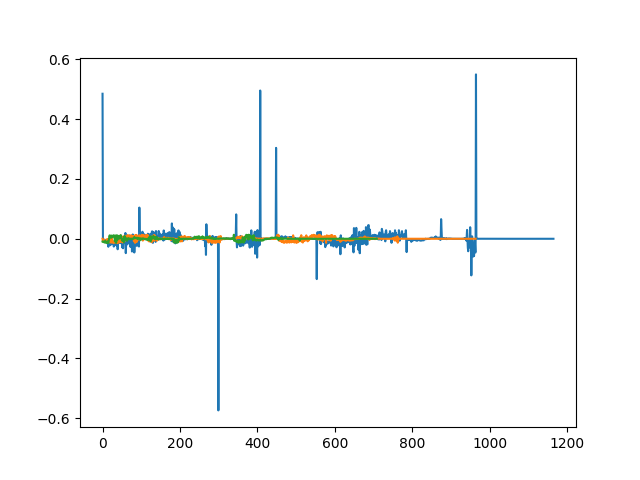

In [ ]:
# plotting the change in the x coord for a joint over time unfiltered (blue) filtered based on the change of the
# x-coord (yellow) and filtered based on the change of all coord (green)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(dx_pos)
ax.plot(dx_pos[~bln_dx_pos])
this_combined_d_arr = bln_dx_pos | bln_dy_pos | bln_dz_pos
ax.plot(dx_pos[~this_combined_d_arr])
plt.show()

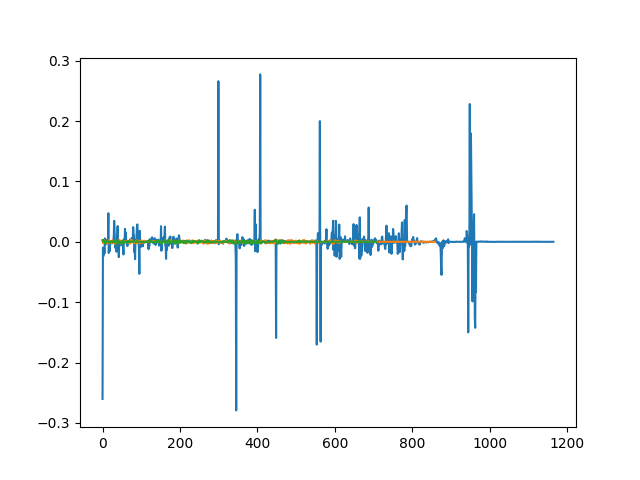

In [ ]:
# plotting the change in the y coord for a joint over time unfiltered (blue) filtered based on the change of the
# y-coord (yellow) and filtered based on the change of all coord (green)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(dy_pos)
ax.plot(dy_pos[~bln_dy_pos])
this_combined_d_arr = bln_dx_pos | bln_dy_pos | bln_dz_pos
ax.plot(dy_pos[~this_combined_d_arr])
plt.show()

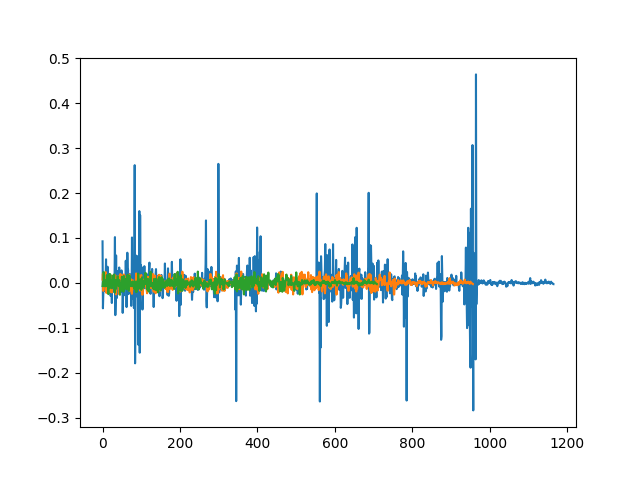

In [ ]:
# plotting the change in the z coord for a joint over time unfiltered (blue) filtered based on the change of the
# z-coord (yellow) and filtered based on the change of all coord (green)

# The z coord shows way more fluctuation in the change (and hence the position) than the y and x coord, probably
# due to the mediapipes estimation of this third dimension

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(dz_pos)
ax.plot(dz_pos[~bln_dz_pos])
this_combined_d_arr = bln_dx_pos | bln_dy_pos | bln_dz_pos
ax.plot(dz_pos[~this_combined_d_arr])
plt.show()

[-2.60149777e-01 -9.98623669e-03 -2.40622014e-02 ... -2.66432762e-05
 -5.09619713e-06  8.03172588e-06]


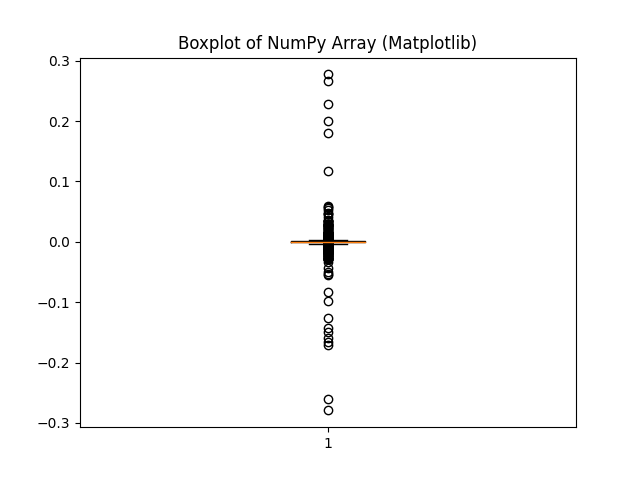

In [ ]:
# bocplot showing the outliers of the change in the x coord
dx_pos = np.diff(y_pos)
print(dx_pos)
fig = plt.figure()
plt.boxplot(dx_pos)
plt.title('Boxplot of NumPy Array (Matplotlib)')
plt.show()

In [ ]:
df[(df['MediapipeFrame']==0) & (df['ViconFrame']==0)]

,MediapipeFrame,ViconFrame,MediapipeAngle,ViconAngle,AngleDifference,Joint,AngleDifferenceMeanOverSameFrame
0,0,0,11.653219,9.332300,2.320920,RightKneeAngle,2.316452
30,0,0,18.183158,9.278008,8.905150,LeftKneeAngle,8.887923
60,0,0,128.762743,NaN,NaN,LeftShoulderAngle,NaN
90,0,0,43.719690,NaN,NaN,RightShoulderAngle,NaN
120,0,0,58.617542,NaN,NaN,LeftElbowAngle,NaN
150,0,0,13.128741,15.852343,2.723602,RightElbowAngle,2.473550
180,0,0,12.799391,21.078939,8.279549,LeftHipAngle,8.295471
210,0,0,11.283906,44.425197,33.141291,RightHipAngle,33.160323


In [ ]:
i=2
print(range(0+i*33,33+i*33))
tmp = T.iloc[range(0+i*33,33+i*33+i),:]
print(tmp.shape)

range(66, 99)
(35, 8)


In [ ]:
mocap_header_reduced

,495,496,497,498,499,500,501,502,503,504,...,602,603,604,605,606,607,608,609,610,611
0,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker,...,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker,Marker
1,Skeleton 001:C7,Skeleton 001:C7,Skeleton 001:C7,Skeleton 001:CLAV,Skeleton 001:CLAV,Skeleton 001:CLAV,Skeleton 001:LANK,Skeleton 001:LANK,Skeleton 001:LANK,Skeleton 001:LASI,...,Skeleton 001:RWRA,Skeleton 001:RWRB,Skeleton 001:RWRB,Skeleton 001:RWRB,Skeleton 001:STRN,Skeleton 001:STRN,Skeleton 001:STRN,Skeleton 001:T10,Skeleton 001:T10,Skeleton 001:T10
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Position,Position,Position,Position,Position,Position,Position,Position,Position,Position,...,Position,Position,Position,Position,Position,Position,Position,Position,Position,Position


Registration of mediapipe to mocap data

In [ ]:
# this defined the mediapipe coordinates as the source of the registration and
# the mocap data to be the target of this transformation
source = blazepose_first_frame[['PosX', 'PosY', 'PosZ']].to_numpy()
mocap_first_frame_reshaped = mocap_first_frame.to_numpy().reshape(24,3)
target = mocap_first_frame_reshaped
#target = target[~np.isnan(target)].reshape(int(target[~np.isnan(target)].shape[0]/3),3)

print(source.shape)
print(target.shape)

(24, 3)
(24, 3)


In [ ]:
source_pcd = o3d.geometry.PointCloud()
target_pcd = o3d.geometry.PointCloud()
# Set the points for the PointClouds
source_pcd.points = o3d.utility.Vector3dVector(source)
target_pcd.points = o3d.utility.Vector3dVector(target)

In [ ]:
def calculate_transformation(source, target):
    """
    ICP (iterative closest point) image registration
    register/transform the source to the target
    """
    # Extract corresponding points using indices
    src_points = source
    tgt_points = target

    # Compute centroids
    src_centroid = np.mean(src_points, axis=0)
    tgt_centroid = np.mean(tgt_points, axis=0)

    # Center the points
    src_centered = src_points - src_centroid
    tgt_centered = tgt_points - tgt_centroid

    # Compute the covariance matrix
    covariance_matrix = np.dot(src_centered.T, tgt_centered)

    # Singular Value Decomposition
    U, _, Vt = np.linalg.svd(covariance_matrix)

    # Compute rotation
    R = np.dot(Vt.T, U.T)

    # Ensure a proper rotation matrix (det(R) should be 1)
    if np.linalg.det(R) < 0:
        Vt[2, :] *= -1
        R = np.dot(Vt.T, U.T)

    # Compute translation
    t = tgt_centroid - np.dot(R, src_centroid)

    return R, t

def apply_transformation(points, R, t):
    return np.dot(points, R.T) + t

def icp1(source, target, max_iterations=10, tolerance=1e-4):
    # Initialize the transformation
    current_source = source.copy()

    for i in range(max_iterations):
        # Calculate transformation
        R, t = calculate_transformation(current_source, target)

        # Apply transformation
        current_source = apply_transformation(current_source, R, t)

        # Compute distances between corresponding points
        distances = np.linalg.norm(current_source - target, axis=1)
        mean_error = np.mean(distances)

        # Print the mean error for monitoring
        print(f"Iteration {i+1}, Mean Error: {mean_error:.6f}")
        # Plot source and target during this iteration
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter3D(target[:, 0], target[:, 1], target[:, 2], c='r', label='Target')
        ax.scatter3D(current_source[0, :], current_source[1, :], current_source[2, :], c='b', label='Source')
        ax.set_title(f'Iteration {i+1}')
        ax.legend()
        #ax.set_aspect('equal')
        plt.show()
        # Check convergence
        if mean_error < tolerance:
            print("Converged.")
            break

    return current_source, R, t
def icp2(source, target, max_iterations=10, tolerance=1e-4):
    # Initialize the transformation
    current_source = source.copy()

    for i in range(max_iterations):
        # Calculate transformation
        R, t = calculate_transformation(current_source, target)

        # Apply transformation
        current_source = apply_transformation(current_source, R, t)

        # Compute distances between corresponding points
        distances = np.linalg.norm(current_source - target, axis=1)
        mean_error = np.mean(distances)

        # Print the mean error for monitoring
        print(f"Iteration {i+1}, Mean Error: {mean_error:.6f}")
        # Plot source and target during this iteration
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter3D(target[:, 0], target[:, 1], target[:, 2], c='r', label='Target')
        ax.scatter3D(current_source[:, 0], current_source[:, 1], current_source[:, 2], c='b', label='Source')
        ax.set_title(f'Iteration {i+1}')
        ax.legend()
        #ax.set_aspect('equal')
        plt.show()
        # Check convergence
        if mean_error < tolerance:
            print("Converged.")
            break

    return current_source, R, t

In [ ]:
def normalize_point_cloud(points):
    """Normalizes a point cloud by centering and scaling.

    Args:
        points: NumPy array representing the point cloud.

    Returns:
        normalized_points: Normalized point cloud.
    """
    centroid = np.mean(points, axis=0)
    centered_points = points - centroid
    scale = np.max(np.linalg.norm(centered_points, axis=1))
    normalized_points = centered_points / scale
    return normalized_points

In [ ]:
# Perform ICP
threshold = 0.02  # Distance threshold for correspondence
transformation = registration_icp(source_pcd, target_pcd, threshold,
                                                np.eye(4),  # Initial transformation (identity)
                                                o3d.pipelines.registration.TransformationEstimationPointToPoint())
#print(transformation)
nan_indices = np.isnan(source).any(axis=1)
source_no_nan = source[~nan_indices]
target_no_nan = target[~nan_indices]
nan_indices = np.isnan(target).any(axis=1)
source_no_nan = source[~nan_indices]
target_no_nan = target[~nan_indices]
target_no_nan = normalize_point_cloud(target_no_nan)
source_no_nan = normalize_point_cloud(source_no_nan)
print(source_no_nan[:,2])
source_no_nan[:,2] = np.flip(source_no_nan[:,2])
print(source_no_nan[:,2])


[ 0.79060948 -0.05004609 -0.97716667 -0.69986644  0.2667663   0.7417686
 -0.64047332 -0.64047332  0.88811621  0.04492123 -0.24065325 -0.9458257
 -0.0357751   0.94013737  0.37659318 -0.62579304  0.85125071 -0.02204509
 -0.02204509]
[-0.02204509 -0.02204509  0.85125071 -0.62579304  0.37659318  0.94013737
 -0.0357751  -0.9458257  -0.24065325  0.04492123  0.88811621 -0.64047332
 -0.64047332  0.7417686   0.2667663  -0.69986644 -0.97716667 -0.05004609
  0.79060948]


In [ ]:
# I tried to rotate the array to start at a more favourable position for the ICP

theta = np.radians(90)
rotation_matrix_3d = np.array([
    [np.cos(theta), -np.sin(theta), 0],
    [0, 0, 1],
    [np.sin(theta), np.cos(theta), 0]
])
rotated_arr = source_no_nan @ rotation_matrix_3d.T

In [ ]:
# Another rotation attempt
source_no_nan_copy = source_no_nan.copy()
tmp = np.rot90(source_no_nan_copy,k=1, axes=(1, 2))
tmp1 = np.empty(source_no_nan.shape, dtype=float)
tmp1[:,0] = tmp[0,:]
tmp1[:,1] = tmp[1,:]
tmp1[:,2] = tmp[2,:]

print(tmp1)

ValueError: Axes=(1, 2) out of range for array of ndim=2.

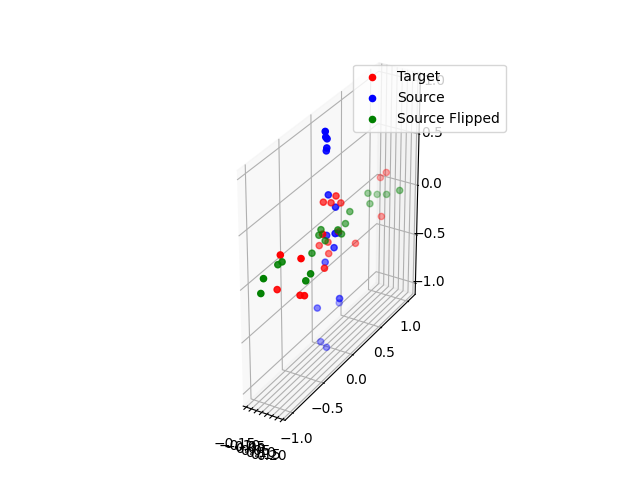

In [ ]:
# plotting the rotated array compared to the original array
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter3D(target_no_nan[:, 0], target_no_nan[:, 1], target_no_nan[:, 2], c='r', label='Target')
ax.scatter3D(source_no_nan[:, 0], source_no_nan[:, 1], np.flip(source_no_nan[:, 2],), c='b', label='Source')
ax.scatter3D(rotated_arr[:,0], rotated_arr[:, 1], rotated_arr[:, 2], c='g', label='Source Flipped')
ax.legend()
ax.set_aspect('equal')
plt.show()

Iteration 1, Mean Error: 0.684132


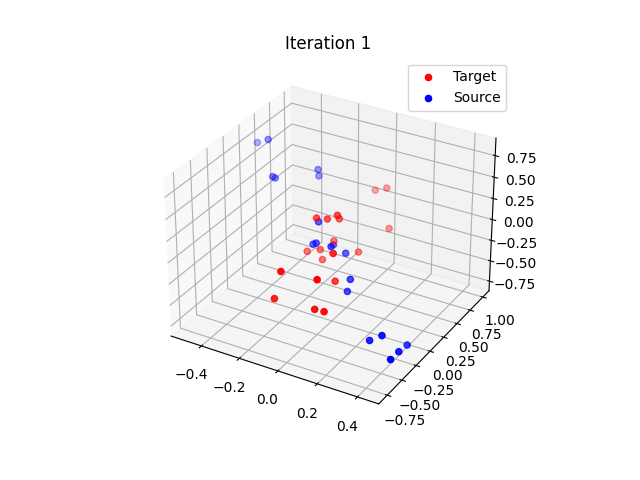

Iteration 2, Mean Error: 0.684132


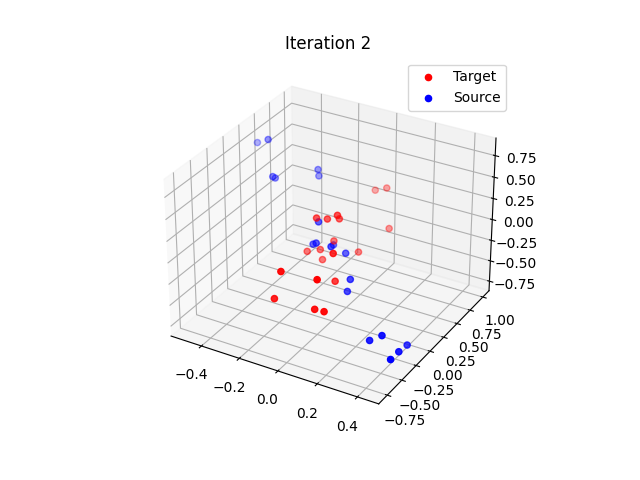

Iteration 3, Mean Error: 0.684132


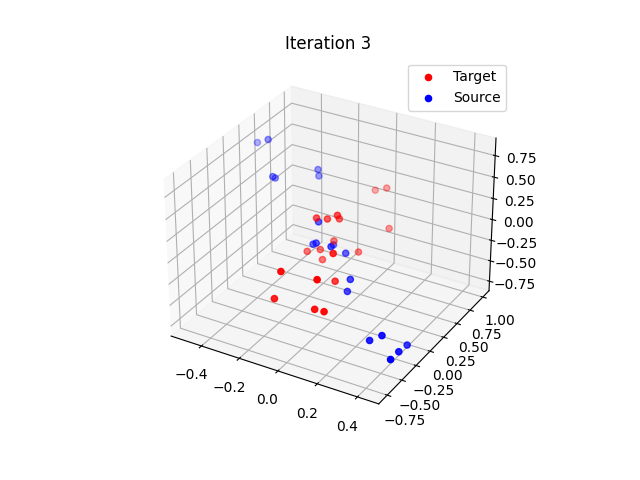

Iteration 4, Mean Error: 0.684132


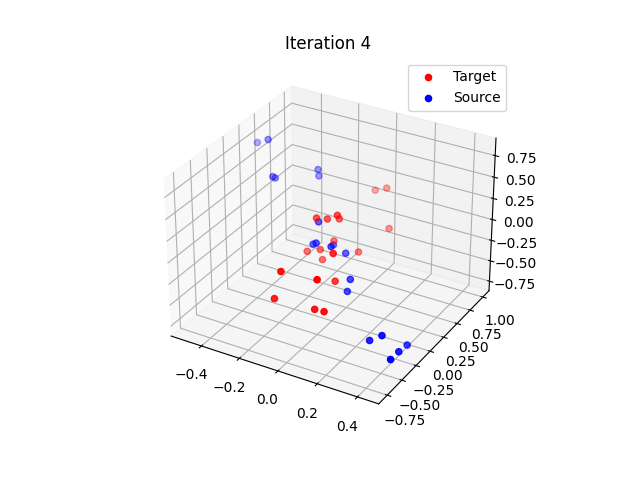

Iteration 5, Mean Error: 0.684132


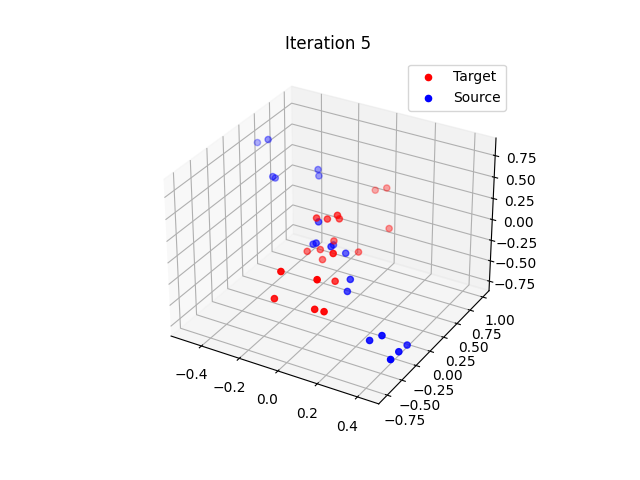

Iteration 6, Mean Error: 0.684132


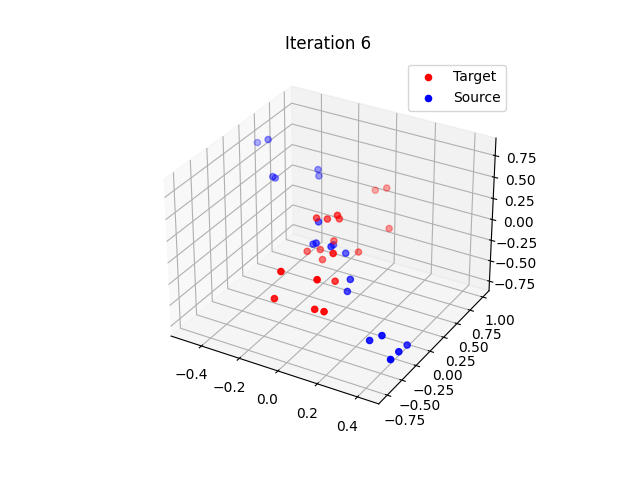

Iteration 7, Mean Error: 0.684132


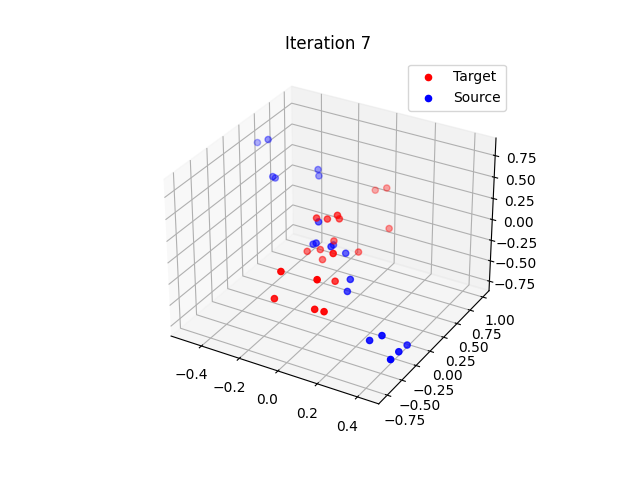

Iteration 8, Mean Error: 0.684132


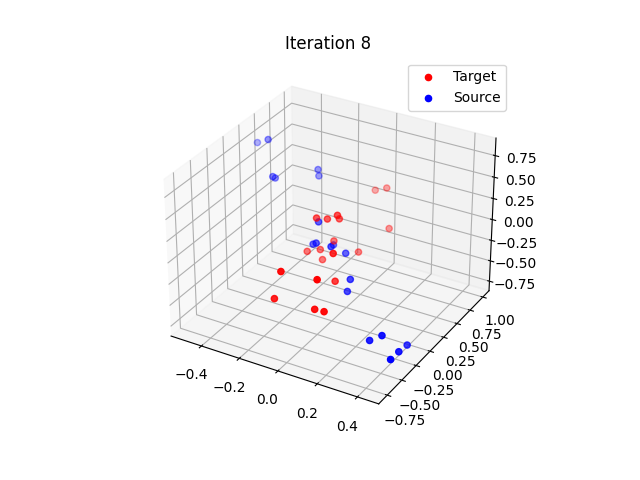

Iteration 9, Mean Error: 0.684132


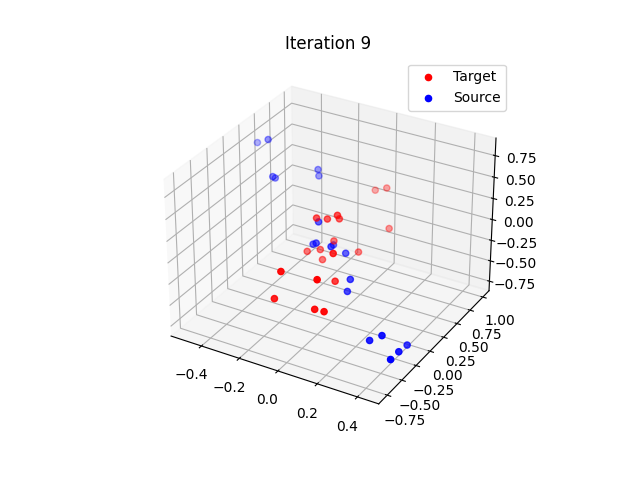

Iteration 10, Mean Error: 0.684132


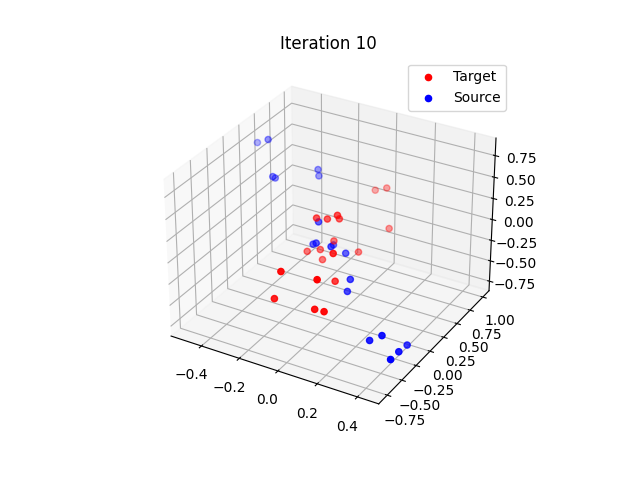

Iteration 1, Mean Error: 0.679591


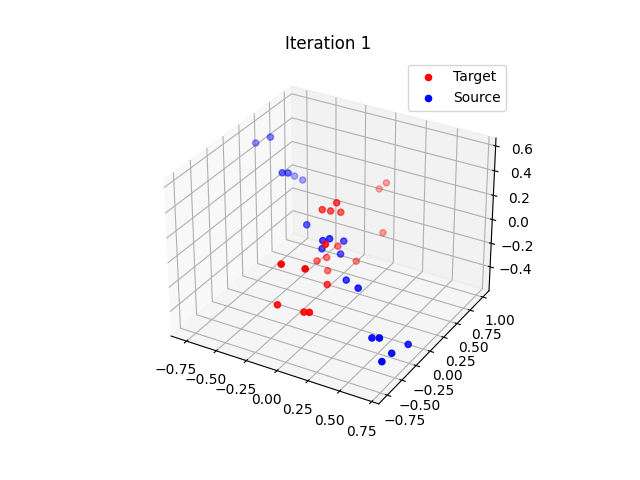

Iteration 2, Mean Error: 0.679591


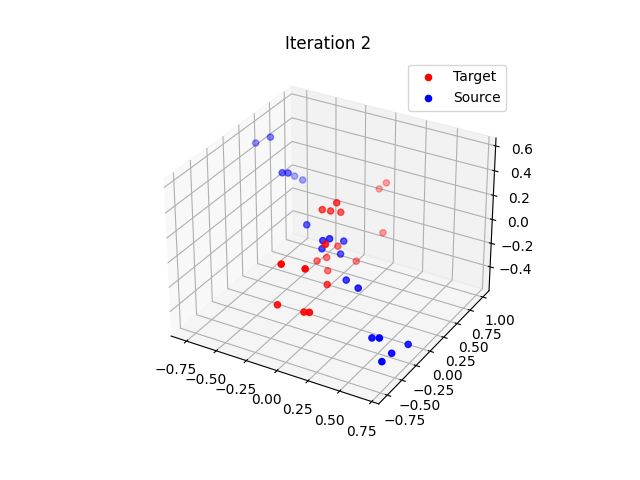

Iteration 3, Mean Error: 0.679591


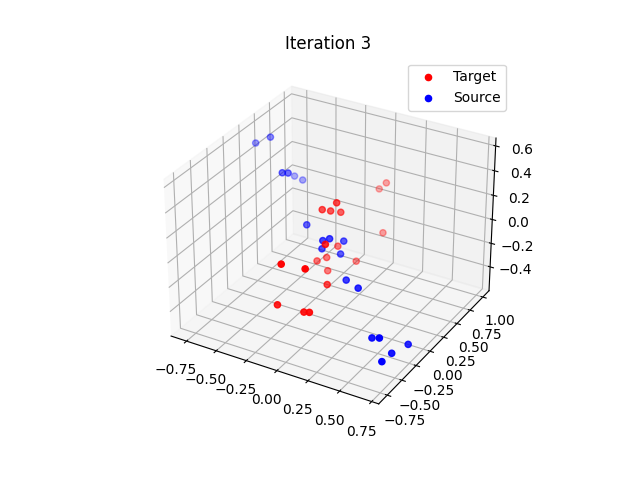

Iteration 4, Mean Error: 0.679591


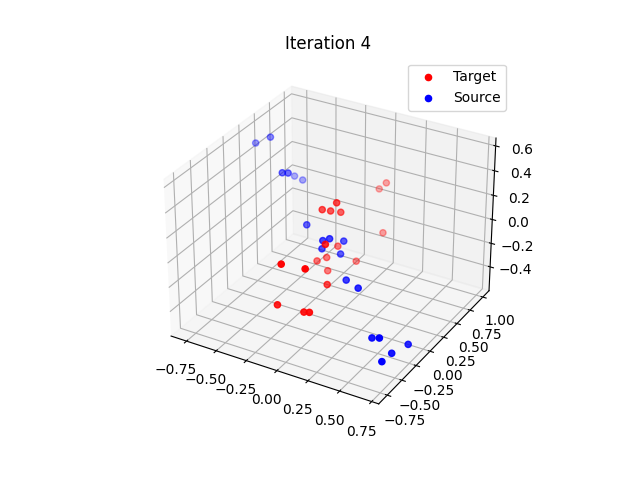

Iteration 5, Mean Error: 0.679591


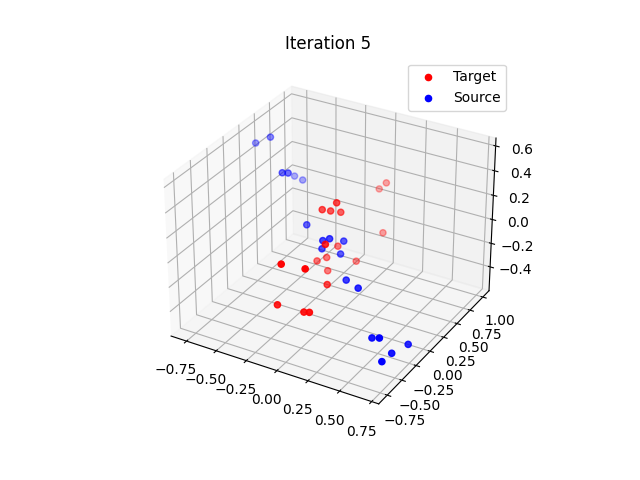

Iteration 6, Mean Error: 0.679591


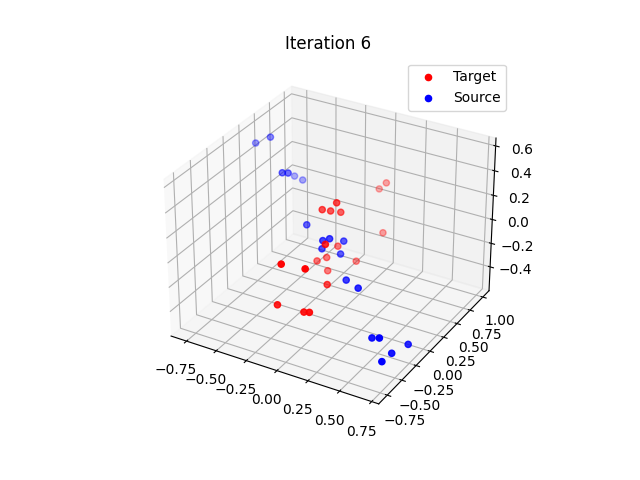

Iteration 7, Mean Error: 0.679591


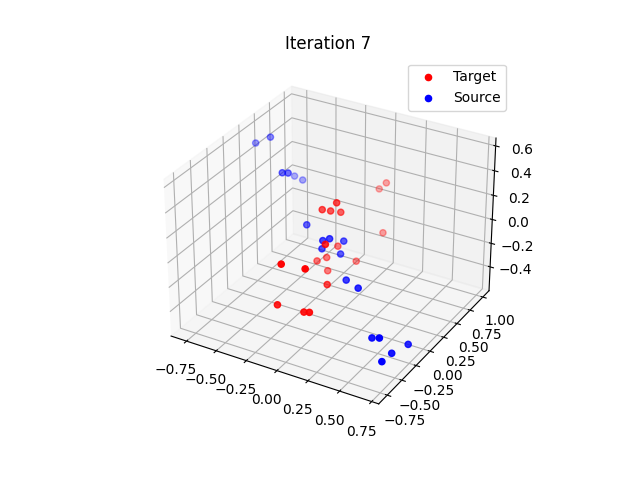

Iteration 8, Mean Error: 0.679591


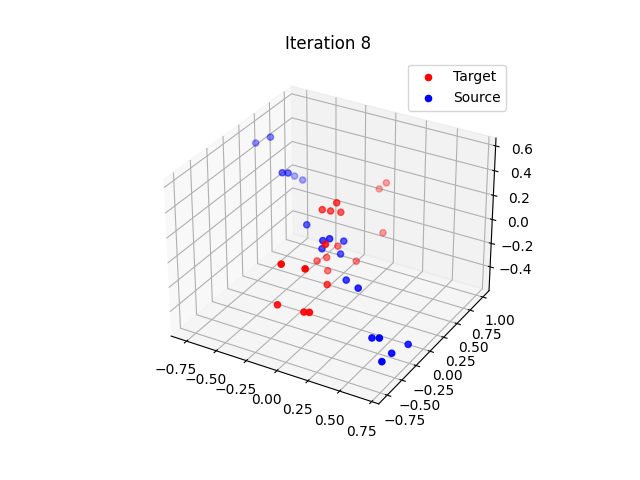

Iteration 9, Mean Error: 0.679591


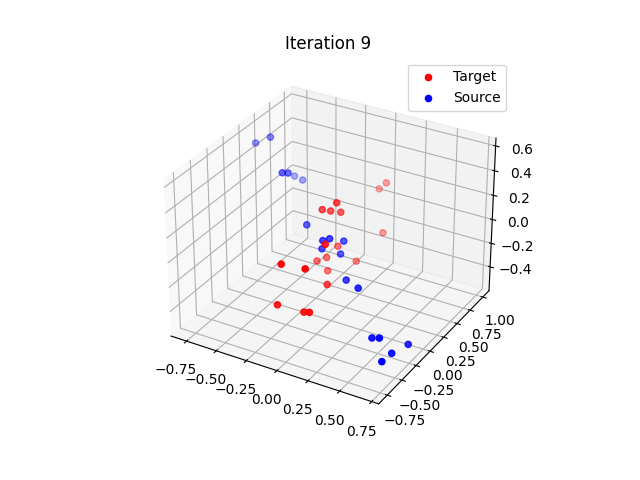

Iteration 10, Mean Error: 0.679591


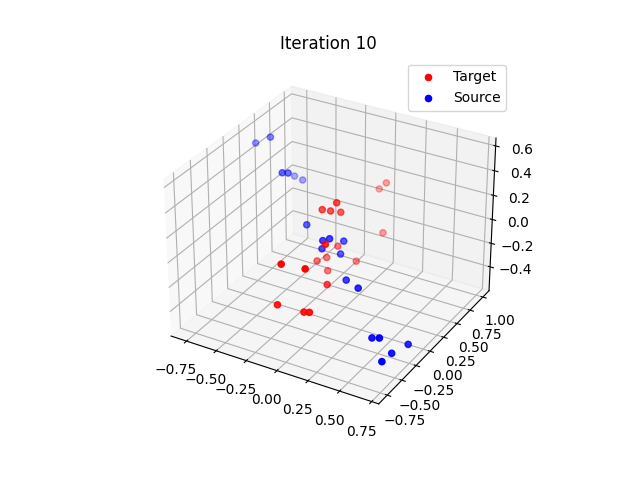

In [ ]:
# perform the ICP on the rotated array
# Also perfrom the ICP on arrays without NaNs
aligned_source, rotation, translation = icp2(rotated_arr, target_no_nan)
aligned_source, rotation, translation = icp2(source_no_nan, target_no_nan)

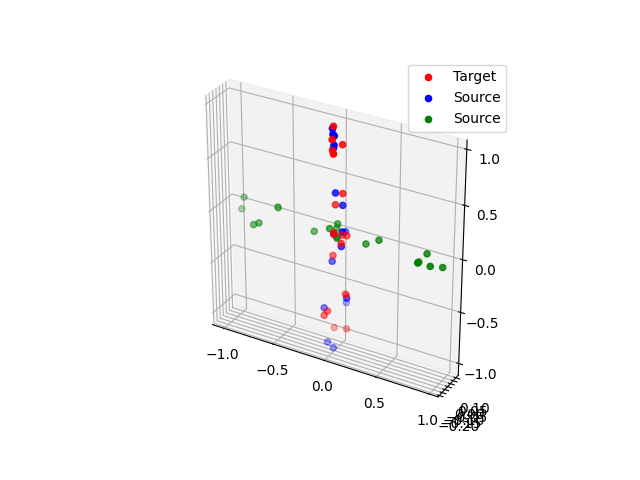

In [ ]:
# again trying to flip the source
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter3D(source_no_nan[:, 0], source_no_nan[:, 1], source_no_nan[:, 2], c='r', label='Target')
ax.scatter3D(source_no_nan_copy[:, 0], source_no_nan_copy[:, 1], np.flip(source_no_nan_copy[:, 2],), c='b', label='Source')
tmp = np.rot90(source_no_nan_copy)
ax.scatter3D(tmp[0,:], tmp[1,:], tmp[2,:], c='g', label='Source')
ax.legend()
ax.set_aspect('equal')
plt.show()

In [ ]:
tmp
tmp1 = numpy.empty(shape, dtype=float, order='C', *, device=None, like=None)
tmp1[:,0] = tmp[0,:]

NameError: name 'tmp1' is not defined

In [ ]:
print(tmp.shape)
print(source_no_nan.shape)
tmp1 = np.empty(source_no_nan.shape, dtype=float)
tmp1[:,0] = tmp[0,:]
tmp1[:,1] = tmp[1,:]
tmp1[:,2] = tmp[2,:]

(3, 19)
(19, 3)


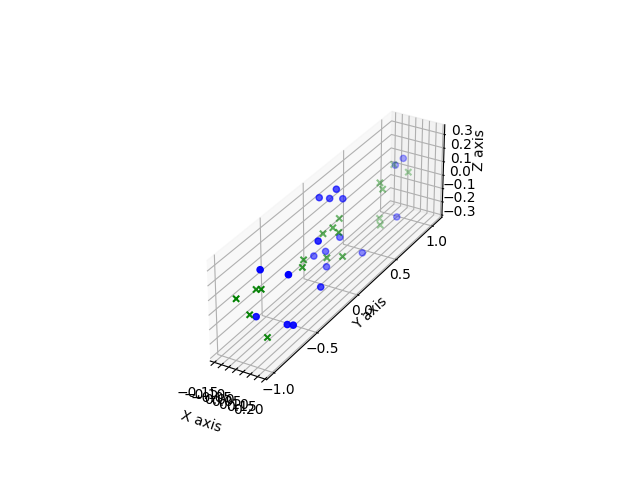

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(target_no_nan[:,0],target_no_nan[:,1],target_no_nan[:,2], c='b', marker='o')
#ax.scatter(source_no_nan[:,0],source_no_nan[:,1],source_no_nan[:,2], c='r', marker='o')
source_no_nan_copy = source_no_nan.copy()
# Trim the last element for pairing
columns_to_rotate = source_no_nan_copy[:, [1, 2]]

# Define the 90-degree rotation matrix
rotation_matrix = np.array([[0, -1], [1, 0]])

# Apply the 90-degree rotation to each pair of columns (row-wise)
rotated_columns = columns_to_rotate @ rotation_matrix.T

# Replace the original two columns with the rotated ones
source_no_nan_copy[:, [1, 2]] = rotated_columns

#source_no_nan_copy = np.flip(source_no_nan_copy,axis=(1))
ax.scatter(source_no_nan_copy[:,0],source_no_nan_copy[:,1],source_no_nan_copy[:,2], c='g', marker='x')
#print(source_no_nan)
#print(source_no_nan_copy)
# Add labels
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
ax.set_aspect('equal')
ax.grid(True)

In [ ]:
aligned_source, rotation, translation = icp(source_no_nan_copy, target_no_nan)

Iteration 1, Mean Error: 0.679591
Iteration 2, Mean Error: 0.679591
Iteration 3, Mean Error: 0.679591
Iteration 4, Mean Error: 0.679591
Iteration 5, Mean Error: 0.679591
Iteration 6, Mean Error: 0.679591
Iteration 7, Mean Error: 0.679591
Iteration 8, Mean Error: 0.679591
Iteration 9, Mean Error: 0.679591
Iteration 10, Mean Error: 0.679591
Iteration 11, Mean Error: 0.679591
Iteration 12, Mean Error: 0.679591
Iteration 13, Mean Error: 0.679591
Iteration 14, Mean Error: 0.679591
Iteration 15, Mean Error: 0.679591
Iteration 16, Mean Error: 0.679591
Iteration 17, Mean Error: 0.679591
Iteration 18, Mean Error: 0.679591
Iteration 19, Mean Error: 0.679591
Iteration 20, Mean Error: 0.679591
Iteration 21, Mean Error: 0.679591
Iteration 22, Mean Error: 0.679591
Iteration 23, Mean Error: 0.679591
Iteration 24, Mean Error: 0.679591
Iteration 25, Mean Error: 0.679591
Iteration 26, Mean Error: 0.679591
Iteration 27, Mean Error: 0.679591
Iteration 28, Mean Error: 0.679591
Iteration 29, Mean Error: 0.6

In [ ]:
print(np.asarray(source_pcd.points))
print(np.asarray(target_pcd.points))

[[ 0.49059162  0.51787418 -0.39157444]
 [ 0.49387512  0.50612587 -0.39728832]
 [ 0.49620566  0.5051378  -0.397291  ]
 [ 0.49854511  0.50423396 -0.39741948]
 [ 0.48726049  0.50685    -0.39467114]
 [ 0.48506707  0.50630558 -0.39477405]
 [ 0.48290619  0.50578308 -0.39488196]
 [ 0.50178343  0.49453828 -0.35505423]
 [ 0.47912607  0.49788988 -0.34363505]
 [ 0.49387699  0.51820445 -0.36799845]
 [ 0.4867177   0.51888663 -0.36496758]
 [ 0.51254493  0.49456307 -0.27860701]
 [ 0.46532655  0.50156868 -0.22703019]
 [ 0.50868416  0.54884708 -0.22335425]
 [ 0.46644512  0.54827583 -0.08670334]
 [ 0.49261802  0.59136641 -0.23237899]
 [ 0.47438368  0.59570789 -0.00705279]
 [ 0.49166417  0.60450411 -0.2453628 ]
 [ 0.47355437  0.58839035  0.00201807]
 [ 0.4871214   0.59898055 -0.25401905]
 [ 0.47674999  0.61054587 -0.01205537]
 [ 0.48609266  0.59397447 -0.23430106]
 [ 0.47915596  0.60515201 -0.00844924]
 [ 0.50541931  0.53497338 -0.01725504]
 [ 0.47881407  0.53622377  0.01734659]
 [ 0.48687291  0.57587087